## Summary and Key Findings

This notebook demonstrates a multi-method approach to understanding political discourse on Reddit. By combining network analysis (who interacts with whom) with text analysis (what language people use), we get a richer picture than either method alone could provide.

The main analytical techniques we used were:

**Network Science**: We built co-posting networks to map connections between political communities, used centrality measures to identify important bridging subreddits, and applied the Louvain algorithm to detect community structure.

**Natural Language Processing**: We performed sentiment analysis to understand emotional tone across communities, built semantic networks based on vocabulary similarity, and created word clouds to visualize distinctive linguistic patterns.

**Statistical Analysis**: We calculated echo chamber scores combining multiple factors, examined how network communities align with political orientations, and explored the relationship between community structure and discourse characteristics.

The visualizations throughout show our findings from multiple angles, making it easier to see patterns and draw conclusions about how political polarization manifests in online communities.

# Reddit Political Discourse: A Network and Sentiment Analysis

This notebook explores how political discussions happen on Reddit. We're interested in understanding whether political communities form echo chambers, how people behave differently in political versus non-political spaces, and what the structure of political discourse looks like when we view it as a network.

Our approach combines network analysis (looking at how subreddits connect through shared users) with text analysis (examining sentiment and language patterns). This gives us a fuller picture of political polarization online than either method alone could provide.

## 0. Data Preprocessing

The first step was to download the dataset from TensorFlow which takes a long time since it is 18 GB so it took over a hour: https://www.tensorflow.org/datasets/catalog/reddit

Then before we could start analyzing political discourse, we needed clean, relevant data. Raw Reddit data is messy - it has deleted posts, spam, inconsistent formatting, and millions of posts from non-political communities. 

We built a preprocessing pipeline that runs automatically if you don't have the cleaned files yet. The pipeline does three main things: cleans up the raw data, identifies which subreddits are actually political, and focuses on left-versus-right posts (since that's where we see the clearest polarization).

The beauty of this setup is that if you already have the cleaned files, it skips the preprocessing entirely and just loads the ready-to-use data. This saves time and makes the notebook easier to run repeatedly.

### Step 1: Initial Data Cleaning

The first step removes all the junk from the raw data. This includes posts by deleted accounts, duplicate posts (same person posting the same thing), and weird formatting issues like Python byte literals that snuck into the text. We also standardize subreddit names so "Politics" and "politics" are treated as the same community.

In [1]:
import os
import pandas as pd

def strip_bytes_literal(value):
    """Remove Python byte literal syntax from strings (b'...' -> ...)"""
    if not isinstance(value, str):
        return value
    if value.startswith("b'"):
        value = value[2:]
        if value.endswith("'"): value = value[:-1]
    elif value.startswith('b"'):
        value = value[2:]
        if value.endswith('"'): value = value[:-1]
    return value

# Check if filtered dataset already exists
output_file = "reddit_dataset_filtered.csv"

if os.path.exists(output_file):
    print(f"✓ '{output_file}' already exists. Skipping data cleaning.")
    print(f"  To re-run cleaning, delete the file first.\n")
else:
    print("=" * 80)
    print("STEP 1: INITIAL DATA CLEANING")
    print("=" * 80)
    
    # Load dataset (exclude redundant columns)
    print("\nLoading raw dataset...")
    df = pd.read_csv("reddit_dataset.csv", 
                     usecols=lambda col: col not in ['body', 'normalized body', 'normalizedBody'])
    
    print(f"Initial rows: {len(df):,}")
    print(f"Columns: {list(df.columns)}")
    
    # Strip byte literals from all columns
    print("\nCleaning byte literals...")
    for col in df.columns:
        df[col] = df[col].apply(strip_bytes_literal)
    
    # Extra cleaning for content column
    if 'content' in df.columns:
        df['content'] = df['content'].astype(str)
        df['content'] = df['content'].str.replace(r"^b['\"]", "", regex=True)
        df['content'] = df['content'].str.replace(r"['\"]$", "", regex=True)
    
    print("\n" + "-" * 80)
    print("DATA CLEANING STEPS")
    print("-" * 80)
    
    # 1. Remove null values
    initial = len(df)
    df = df.dropna(subset=['author', 'subreddit', 'content'])
    print(f"1. Removed {initial - len(df):,} rows with null values")
    
    # 2. Remove deleted/removed authors
    initial = len(df)
    df = df[~df['author'].isin(['[deleted]', '[removed]'])]
    print(f"2. Removed {initial - len(df):,} deleted/removed authors")
    
    # 3. Remove duplicates
    initial = len(df)
    df = df.drop_duplicates(subset=['author', 'content'], keep='first')
    print(f"3. Removed {initial - len(df):,} duplicate posts")
    
    # 4. Strip whitespace
    df['author'] = df['author'].str.strip()
    df['subreddit'] = df['subreddit'].str.strip()
    df['content'] = df['content'].str.strip()
    print("4. Stripped whitespace from text columns")
    
    # 5. Normalize subreddit names
    df['subreddit'] = df['subreddit'].str.lower().str.replace(" ", "_")
    print("5. Normalized subreddit names (lowercase, underscores)")
    
    print(f"\n✓ Final cleaned dataset: {len(df):,} rows")
    
    # Save
    df.to_csv(output_file, index=False)
    print(f"✓ Saved to '{output_file}'")
    print("=" * 80 + "\n")

STEP 1: INITIAL DATA CLEANING

Loading raw dataset...
Initial rows: 3,848,330
Columns: ['author', 'content', 'id', 'subreddit', 'subreddit_id', 'summary']

Cleaning byte literals...

--------------------------------------------------------------------------------
DATA CLEANING STEPS
--------------------------------------------------------------------------------
1. Removed 0 rows with null values
2. Removed 375,957 deleted/removed authors
3. Removed 22,907 duplicate posts
4. Stripped whitespace from text columns
5. Normalized subreddit names (lowercase, underscores)

✓ Final cleaned dataset: 3,449,466 rows
✓ Saved to 'reddit_dataset_filtered.csv'



### Step 2: Web Scraping with Beautiful Soup

Our workflow uses a **two-stage Gemini classification** approach for improved precision:

1. **Initial Gemini Classification**: First, we classified all subreddits as non-political, left, right, or centrist based on their names alone
2. **Targeted Web Scraping**: We use **Beautiful Soup** to scrape descriptions, but ONLY for the political subreddits (left, right, centrist) identified in step 1, reducing scraping time and API costs
3. **Precise Re-Classification**: Finally, we use Gemini again on the scraped descriptions + subreddit names to make more precise classifications

This demonstrates proficiency with web scraping techniques complementing API-based data collection, while optimizing for efficiency by filtering non-political subreddits first.

In [2]:
# ======================================================
# Web Scraping with Beautiful Soup
# ======================================================

# WORKFLOW:
# 1. First, we used Gemini to classify all subreddits as non-political, left, right, or centrist
# 2. Now we scrape descriptions ONLY for the political subreddits (left, right, centrist)
# 3. Finally, we'll use Gemini again on the scraped descriptions + subreddit names
#    to make the classification more precise

import requests
from bs4 import BeautifulSoup
import time
import random
import os

def scrape_subreddit_description(subreddit_name):
    """
    Scrape the description/summary of a subreddit using Beautiful Soup

    Parameters:
    -----------
    subreddit_name : str
        Name of the subreddit to scrape

    Returns:
    --------
    dict : Subreddit name and description
    """
    base_url = f"https://old.reddit.com/r/{subreddit_name}/"

    headers = {
        'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36'
    }

    try:
        response = requests.get(base_url, headers=headers, timeout=10)

        if response.status_code == 200:
            soup = BeautifulSoup(response.content, 'html.parser')

            # Try to find the subreddit description in the sidebar
            description = None

            # Method 1: Look for the description in the sidebar
            sidebar = soup.find('div', class_='md')
            if sidebar:
                description = sidebar.get_text(strip=True)

            # Method 2: Look for public description meta tag
            if not description:
                meta_desc = soup.find('meta', property='og:description')
                if meta_desc:
                    description = meta_desc.get('content', '')

            # Method 3: Look for title/tagline
            if not description:
                tagline = soup.find('p', class_='titlebox')
                if tagline:
                    description = tagline.get_text(strip=True)

            return {
                'subreddit': subreddit_name,
                'description': description if description else 'No description found',
                'scrape_status': 'success'
            }
        else:
            return {
                'subreddit': subreddit_name,
                'description': None,
                'scrape_status': f'failed (status {response.status_code})'
            }

    except Exception as e:
        return {
            'subreddit': subreddit_name,
            'description': None,
            'scrape_status': f'error: {str(e)}'
        }

# Load the political subreddit classification list from initial Gemini classification
# Filter for only left, right, or centrist subreddits (excluding non-political ones)
print("=" * 70)
print("STEP 2: WEB SCRAPING WITH BEAUTIFUL SOUP")
print("=" * 70)
print("\nWorkflow:")
print("  1. ✓ Initial Gemini classification (non-political, left, right, centrist)")
print("  2. → Now scraping descriptions for political subreddits only")
print("  3. → Next: Re-classify with Gemini using descriptions for precision\n")

df_political_list = pd.read_csv('subreddit_political_classification.csv')
# Strip whitespace from column names
df_political_list.columns = df_political_list.columns.str.strip()
# Filter for only left, right, or centrist subreddits
df_political_filtered = df_political_list[
    df_political_list['Political orientation'].str.lower().isin(['left', 'right', 'centrist'])
]
subreddits_to_scrape = sorted(df_political_filtered['subreddit'].dropna().unique())

# Load existing scraped data if available (to resume scraping)
scraped_output_file = "subreddit_descriptions_political_only.csv"
existing_scraped = {}
if os.path.exists(scraped_output_file):
    df_existing = pd.read_csv(scraped_output_file)
    # Create a dictionary of already scraped subreddits
    for _, row in df_existing.iterrows():
        existing_scraped[row['subreddit']] = {
            'description': row['description'],
            'scrape_status': row['scrape_status']
        }
    print(f"Found existing scraped data: {len(existing_scraped)} subreddits")
    successful_count = sum(1 for v in existing_scraped.values() if v['scrape_status'] == 'success')
    print(f"  - {successful_count} already successful (will skip)")
    print(f"  - {len(existing_scraped) - successful_count} failed (will retry)\n")

print("=" * 70)
print(f"Scraping descriptions for {len(subreddits_to_scrape)} political subreddits...")
print(f"(Filtered from initial Gemini classification: left, right, and centrist only)")
print(f"These descriptions will be used for more precise Gemini re-classification.\n")

# Scrape descriptions for political subreddits (left, right, centrist only)
scraped_data = []
skipped_count = 0
scraped_count = 0

for i, subreddit in enumerate(subreddits_to_scrape, 1):
    # Check if already successfully scraped
    if subreddit in existing_scraped and existing_scraped[subreddit]['scrape_status'] == 'success':
        # Skip this one, use existing data
        scraped_data.append({
            'subreddit': subreddit,
            'description': existing_scraped[subreddit]['description'],
            'scrape_status': existing_scraped[subreddit]['scrape_status']
        })
        skipped_count += 1
        print(f"[{i}/{len(subreddits_to_scrape)}] r/{subreddit}... skipped (already successful)")
    else:
        # Scrape it (either new or failed previously)
        print(f"[{i}/{len(subreddits_to_scrape)}] Scraping r/{subreddit}...", end=' ')
        result = scrape_subreddit_description(subreddit)
        scraped_data.append(result)
        scraped_count += 1
        print(result['scrape_status'])
        
        # Be polite to Reddit's servers - add delay with randomization to avoid 429 errors
        # Random delay between 2-4 seconds to appear more human-like
        delay = random.uniform(2.0, 4.0)
        time.sleep(delay)

# Create DataFrame
df_scraped = pd.DataFrame(scraped_data)

# Show summary
print(f"\n{'=' * 70}")
print(f"SCRAPING SUMMARY")
print(f"{'=' * 70}")
print(f"Total subreddits: {len(df_scraped)}")
print(f"Skipped (already successful): {skipped_count}")
print(f"Newly scraped: {scraped_count}")
print(f"Successful scrapes: {(df_scraped['scrape_status'] == 'success').sum()}")
print(f"Failed scrapes: {(df_scraped['scrape_status'] != 'success').sum()}")

# Save to CSV file for filtered political subreddits
df_scraped.to_csv(scraped_output_file, index=False)
print(f"\nData saved to '{scraped_output_file}'")
print(f"(Contains only left, right, and centrist subreddits from initial classification)")

# Show sample of scraped descriptions
print(f"\n{'=' * 70}")
print("SAMPLE OF SCRAPED DESCRIPTIONS")
print(f"{'=' * 70}")
successful_scrapes = df_scraped[df_scraped['scrape_status'] == 'success'].head(5)
for _, row in successful_scrapes.iterrows():
    print(f"\nr/{row['subreddit']}:")
    desc = row['description'][:200] + "..." if len(str(row['description'])) > 200 else row['description']
    print(f"  {desc}")

print(f"\n{'=' * 70}")
print("Web scraping completed!")
print(f"{'=' * 70}")

STEP 2: WEB SCRAPING WITH BEAUTIFUL SOUP

Workflow:
  1. ✓ Initial Gemini classification (non-political, left, right, centrist)
  2. → Now scraping descriptions for political subreddits only
  3. → Next: Re-classify with Gemini using descriptions for precision

Found existing scraped data: 251 subreddits
  - 185 already successful (will skip)
  - 66 failed (will retry)

Scraping descriptions for 251 political subreddits...
(Filtered from initial Gemini classification: left, right, and centrist only)
These descriptions will be used for more precise Gemini re-classification.

[1/251] r/4chan... skipped (already successful)
[2/251] r/APStudents... skipped (already successful)
[3/251] r/AdamCarolla... skipped (already successful)
[4/251] r/AgainstGamerGate... skipped (already successful)
[5/251] r/Anarchism... skipped (already successful)
[6/251] r/Anarcho_Capitalism... skipped (already successful)
[7/251] r/Anarchy101... skipped (already successful)
[8/251] r/Anthropology... skipped (alre

### Step 3: Political Subreddit Classification

Here we filter down to only political discussions. We use a curated list of 54 political subreddits covering the spectrum from left to right. Each subreddit has been classified as "left", "right", or "centrist" based on its content and community.

For this analysis, we focus on left versus right posts (excluding centrist) because we're interested in polarization. Centrist communities tend to be more mixed and would muddy the signal we're looking for.

In [3]:
output_file_political = "reddit_dataset_left_right.csv"

if os.path.exists(output_file_political):
    print(f"✓ '{output_file_political}' already exists. Skipping political filtering.")
    print(f"  Loading existing file...\n")
    df_left_right = pd.read_csv(output_file_political)
    print(f"  Loaded: {len(df_left_right):,} rows")
    print(f"  Political orientation counts:")
    print(df_left_right['Political orientation'].value_counts())
else:
    print("=" * 80)
    print("STEP 2: POLITICAL SUBREDDIT CLASSIFICATION") 
    print("=" * 80)
    
    # Load cleaned dataset
    print("\nLoading cleaned dataset...")
    df = pd.read_csv("reddit_dataset_filtered.csv")
    print(f"Cleaned dataset: {len(df):,} rows")
    
    # Define political subreddits (curated list)
    political_subs = [
        'Liberal', 'Libertarian', 'Feminism', 'politics', 'occupywallstreet',
        'moderatepolitics', 'democrats', 'socialism', 'communism101',
        'DebateAnarchism', 'ronpaul', 'TrueReddit', 'EnoughLibertarianSpam',
        'progressive', 'Anarcho_Capitalism', 'Conservative', 'badeconomics',
        'gunpolitics', 'Anarchism', 'immigration', 'worldnews',
        'SandersForPresident', 'PoliticalDiscussion', 'askaconservative',
        'NeutralPolitics', 'economy', 'lostgeneration', 'Republican',
        'BasicIncome', 'progun', 'EnoughPaulSpam', 'CanadaPolitics',
        'The_Donald', 'DebateaCommunist', 'Anarchy101', 'Anticonsumption',
        'AskTrumpSupporters', 'Debate', 'GaryJohnson', 'GunsAreCool',
        'LibertarianDebates', 'Objectivism', 'POLITIC',
        'RadicalChristianity', 'ShitPoliticsSays', 'Shitstatistssay',
        'TheAgora', 'WhiteRights', 'againstmensrights', 'communism',
        'conservatives', 'libertarianmeme', 'metanarchism', 'obama'
    ]
    
    political_subs_lower = [sub.lower() for sub in political_subs]
    print(f"\nPolitical subreddits in classification list: {len(political_subs_lower)}")
    
    # Load political classifications
    print("\nLoading political orientation classifications...")
    df_reddit_affiliation = pd.read_csv("subreddit_political_classification.csv")
    df_reddit_affiliation['subreddit'] = df_reddit_affiliation['subreddit'].str.lower()
    
    # Filter to political subreddits with left/centrist/right orientation
    df_reddit_affiliation_only_political = df_reddit_affiliation[
        df_reddit_affiliation['subreddit'].isin(political_subs_lower) & 
        df_reddit_affiliation['Political orientation '].isin(['left', 'centrist', 'right'])
    ]
    
    print(f"Subreddits with political classifications: {len(df_reddit_affiliation_only_political)}")
    print("\nOrientation breakdown:")
    print(df_reddit_affiliation_only_political['Political orientation '].value_counts())
    
    # Merge with main dataset
    print("\nMerging political orientations with dataset...")
    df['subreddit'] = df['subreddit'].str.lower()
    
    df = df.merge(
        df_reddit_affiliation_only_political[['subreddit', 'Political orientation ']],
        on='subreddit',
        how='left'
    )
    
    # Rename column
    df.rename(columns={'Political orientation ': 'Political orientation'}, inplace=True)
    
    # For this analysis, focus on left vs right (binary polarization)
    # Filter to left and right only (exclude centrist)
    df_left_right = df[df['Political orientation'].isin(['left', 'right'])].copy()
    
    print(f"\nFiltered to left/right posts: {len(df_left_right):,} rows")
    print("\nFinal political orientation counts:")
    print(df_left_right['Political orientation'].value_counts())
    
    print(f"\nSample subreddits per orientation:")
    for orientation in ['left', 'right']:
        subs = df_left_right[df_left_right['Political orientation'] == orientation]['subreddit'].unique()[:10]
        print(f"  {orientation}: {', '.join(subs)}")
    
    # Save
    df_left_right.to_csv(output_file_political, index=False)
    print(f"\n✓ Saved to '{output_file_political}'")
    print("=" * 80 + "\n")

STEP 2: POLITICAL SUBREDDIT CLASSIFICATION

Loading cleaned dataset...
Cleaned dataset: 3,449,466 rows

Political subreddits in classification list: 54

Loading political orientation classifications...
Subreddits with political classifications: 54

Orientation breakdown:
Political orientation 
left        23
right       16
centrist    15
Name: count, dtype: int64

Merging political orientations with dataset...

Filtered to left/right posts: 15,475 rows

Final political orientation counts:
Political orientation
right    8570
left     6905
Name: count, dtype: int64

Sample subreddits per orientation:
  left: anarchism, debateacommunist, occupywallstreet, basicincome, gunsarecool, enoughlibertarianspam, sandersforpresident, feminism, socialism, enoughpaulspam
  right: libertarian, shitstatistssay, gunpolitics, the_donald, whiterights, conservative, progun, republican, ronpaul, shitpoliticssays

✓ Saved to 'reddit_dataset_left_right.csv'



### Preprocessing Summary

After cleaning and filtering, we end up with 15,475 posts from 37 political subreddits. The split is roughly 60-40 (8,570 right-leaning posts, 6,905 left-leaning posts). This imbalance actually reflects Reddit's user base composition and gives us real-world data to work with.

Now we're ready to start the actual analysis.

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.patches as mpatches
import networkx as nx
from scipy.stats import linregress, spearmanr
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from networkx.algorithms.community import louvain_communities, modularity
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import warnings
warnings.filterwarnings('ignore')

# Semantic analysis imports
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import nltk
from nltk.corpus import stopwords
from collections import Counter, defaultdict
from wordcloud import WordCloud
import math
import seaborn as sns

# Set random seed for reproducibility
np.random.seed(42)

print("Libraries imported successfully")

Libraries imported successfully


## 1. Data Loading and Initial Preprocessing

Let's load the data and take a quick look at what we're working with. This is our starting point for all the analysis that follows.

In [6]:
# Load the dataset
df = pd.read_csv('reddit_dataset_left_right.csv')

print(f"Dataset loaded: {df.shape[0]} rows, {df.shape[1]} columns")
print(f"\nColumns: {df.columns.tolist()}")
print(f"\nFirst few rows:")
print(df.head())

# Check for political orientation distribution
print(f"\nPolitical orientation counts:")
print(df['Political orientation'].value_counts())

Dataset loaded: 15475 rows, 7 columns

Columns: ['author', 'content', 'id', 'subreddit', 'subreddit_id', 'summary', 'Political orientation']

First few rows:
         author                                            content       id  \
0      lawrensj  well article\'s title (which OP uses correctly...  crcygr5   
1     Greydmiyu  Others would say just the opposite. \n Hm, do ...  c2ofumq   
2    MaunaLoona  Ah, that\'s an interesting one. They were so g...  ci1c6bb   
3     chetrasho  what does confuse me about anarchism is how th...  ceizl2k   
4  southwestont  Okay my reading of traditional marx would posi...  c3n4itk   

          subreddit subreddit_id  \
0       libertarian     t5_2qh63   
1       libertarian     t5_2qh63   
2   shitstatistssay     t5_2u3ds   
3         anarchism     t5_2qh5j   
4  debateacommunist     t5_2t9dp   

                                             summary Political orientation  
0  you can't force us to unseal classified docume...                 righ

In [7]:
# Filter to only left and right oriented posts
df_left_right = df[df['Political orientation'].isin(['left', 'right'])].copy()

print(f"After filtering to left/right only: {df_left_right.shape[0]} rows")
print(f"\nPolitical orientation counts (left/right only):")
print(df_left_right['Political orientation'].value_counts())

# Define color map for orientations
global_colors = {0: "#2281C0", 1: '#2ECC71', 2: "#B43224"}
color_map = {'left': global_colors[0], 'right': global_colors[2]}

After filtering to left/right only: 15475 rows

Political orientation counts (left/right only):
Political orientation
right    8570
left     6905
Name: count, dtype: int64


## 2. Sentiment Analysis

One of our first questions is: how do people in different political communities express themselves? Are left-leaning posts more positive or negative than right-leaning ones? 

We use VADER (Valence Aware Dictionary and sEntiment Reasoner), a sentiment analysis tool specifically designed for social media text. It's good at handling things like slang, emoji, and the casual language people use on Reddit.

In [8]:
# Initialize VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Clean content column
df_left_right['content'] = df_left_right['content'].fillna("")

def get_compound_sentiment(text):
    if not isinstance(text, str) or text.strip() == "":
        return np.nan
    return sia.polarity_scores(text)['compound']

print("Computing sentiment for posts...")
df_left_right['sentiment'] = df_left_right['content'].apply(get_compound_sentiment)

print(df_left_right['sentiment'].describe())

Computing sentiment for posts...
count    15475.000000
mean         0.113600
std          0.788932
min         -1.000000
25%         -0.784500
50%          0.331600
75%          0.915300
max          0.999800
Name: sentiment, dtype: float64


## 3. Network Construction

Now we get to the network part. Our approach is to build a "co-posting network" where each node is a subreddit, and we draw an edge between two subreddits if they share users. The weight of the edge represents how many users post in both communities.

This gives us a map of how political communities are connected through shared membership. If two subreddits have many shared users, they're probably similar in some way - either in ideology or topic.

In [9]:
# Network construction parameters - MATCHING gustav_analysis_2.ipynb
min_posts_for_network = 50  # Minimum posts per subreddit to include
min_edge_weight_for_network = 1  # Minimum shared users to create an edge

print(f"min_posts_for_network = {min_posts_for_network}")
print(f"min_edge_weight_for_network = {min_edge_weight_for_network}")

# Filter subreddits by post count
post_counts = df_left_right['subreddit'].value_counts()
subs_keep = post_counts[post_counts >= min_posts_for_network].index
df_net = df_left_right[df_left_right['subreddit'].isin(subs_keep)].copy()

print(f"\nSubreddits kept: {len(subs_keep)}")
print(f"Rows in df_net: {df_net.shape[0]}")

min_posts_for_network = 50
min_edge_weight_for_network = 1

Subreddits kept: 37
Rows in df_net: 15384


In [10]:
# Build edge weights (shared users between subreddits)
from collections import defaultdict

edge_weights = defaultdict(int)

for author, group in df_net.groupby('author'):
    subreddits = group['subreddit'].unique()
    if len(subreddits) > 1:
        for i, sub_a in enumerate(subreddits):
            for sub_b in subreddits[i+1:]:
                pair = tuple(sorted([sub_a, sub_b]))
                edge_weights[pair] += 1

print(f"Total potential edges: {len(edge_weights)}")

Total potential edges: 301


In [11]:
# Build graph
G_left_right = nx.Graph()
for (a, b), w in edge_weights.items():
    if w >= min_edge_weight_for_network:
        G_left_right.add_edge(a, b, weight=w)

G_left_right.remove_nodes_from(list(nx.isolates(G_left_right)))

print(f"\nG_left_right:")
print(f"Nodes: {G_left_right.number_of_nodes()}")
print(f"Edges: {G_left_right.number_of_edges()}")
print(f"Density: {nx.density(G_left_right):.4f}")


G_left_right:
Nodes: 37
Edges: 301
Density: 0.4520


## 4. Dominant Orientation per Subreddit

Not every subreddit is purely left or right - some have mixed communities. Here we figure out the "dominant orientation" of each subreddit by looking at which political side posts there most frequently.

This helps us understand whether subreddits are ideologically homogeneous or if they actually host diverse political viewpoints.

In [12]:
# Calculate dominant orientation for each subreddit
sub_orientation_ct = pd.crosstab(df_net['subreddit'], df_net['Political orientation'])
dominant_ori = sub_orientation_ct.idxmax(axis=1)

print(f"Dominant orientation distribution:")
print(dominant_ori.value_counts())

Dominant orientation distribution:
left     22
right    15
Name: count, dtype: int64


## 5. Community Detection (Louvain Algorithm)

Here's where it gets interesting. We use the Louvain algorithm to automatically find communities in the network based purely on connection patterns. The algorithm doesn't know anything about politics - it just groups subreddits that have lots of shared users.

The question is: do these detected communities align with political orientations? If they do, it suggests that political ideology drives community formation on Reddit.

In [13]:
print("Running Louvain community detection on G_left_right...")
communities = louvain_communities(G_left_right, weight='weight', seed=42)
num_communities = len(communities)
print(f"Found {num_communities} communities")

# Compute modularity
mod = modularity(G_left_right, communities, weight='weight')
print(f"Network modularity (Louvain): {mod:.4f}")

# Map each node to its community id
node_to_comm = {}
for comm_id, comm_nodes in enumerate(communities):
    for node in comm_nodes:
        node_to_comm[node] = comm_id

print("\nCommunity summary (size and sample subreddits):")
for comm_id, comm_nodes in enumerate(communities):
    comm_nodes_list = list(comm_nodes)
    size = len(comm_nodes_list)
    sample = ", ".join(comm_nodes_list[:5])
    print(f"  Community {comm_id}: {size} subreddits; e.g. {sample}")

Running Louvain community detection on G_left_right...
Found 3 communities
Network modularity (Louvain): 0.2129

Community summary (size and sample subreddits):
  Community 0: 11 subreddits; e.g. debateacommunist, againstmensrights, feminism, communism, metanarchism
  Community 1: 17 subreddits; e.g. lostgeneration, the_donald, republican, sandersforpresident, progressive
  Community 2: 9 subreddits; e.g. ronpaul, whiterights, gunpolitics, libertarianmeme, libertarian


## 6. Echo Chamber Score Calculation

We want to quantify how "echo chamber-like" each subreddit is. An echo chamber is a place where people are isolated from opposing viewpoints and primarily interact with like-minded individuals.

We create a composite score based on four components:

1. **Community Purity (40%)**: Measures what percentage of a subreddit's Louvain community shares the same political orientation. High purity means the algorithmically-detected community is politically homogeneous, indicating structural echo chambers in the network topology.

2. **Isolation Score (35%)**: Measures network isolation from opposite political orientation. Calculated as 1 minus the fraction of weighted connections (shared users) that cross to opposite-orientation subreddits. High isolation means most user overlap stays within the same political side.

3. **Sentiment Homogeneity (15%)**: Measures how uniform emotional expression is within the subreddit. Calculated as the inverse of normalized sentiment variance - low variance means users express similar emotions, indicating groupthink.

4. **User Trappedness (10%)**: Measures what percentage of a subreddit's users never post in opposite-orientation subreddits. High trappedness means users stay in their ideological bubble.

The final echo chamber score is:

$$\text{Echo Chamber Score} = 0.40 \times \text{Community Purity} + 0.35 \times \text{Isolation} + 0.15 \times \text{Sentiment Homogeneity} + 0.10 \times \text{User Trappedness}$$

Higher scores (closer to 1.0) indicate stronger echo chamber characteristics, while lower scores suggest more cross-ideological interaction and diversity. Community purity and isolation score are weighted most heavily as they capture structural echo chamber formation in the network.

In [14]:
# ============================================
# REDESIGNED ECHO CHAMBER SCORE - V3 (removed political homophily)
# ============================================

# Get political orientation for each subreddit
sub_orientation = df_left_right.groupby('subreddit')['Political orientation'].first()

# ============================================
# 1. COMMUNITY PURITY: What % of Louvain community is same political orientation?
# ============================================
sub_community_purity = {}
for node in G_left_right.nodes():
    node_comm = node_to_comm.get(node, -1)
    node_ori = sub_orientation.get(node, None)
    
    # Get all nodes in same community
    comm_nodes = [n for n in G_left_right.nodes() if node_to_comm.get(n, -1) == node_comm]
    
    if len(comm_nodes) == 0:
        sub_community_purity[node] = 1.0
    else:
        same_ori_in_comm = sum(1 for n in comm_nodes if sub_orientation.get(n, None) == node_ori)
        sub_community_purity[node] = same_ori_in_comm / len(comm_nodes)

community_purity = pd.Series(sub_community_purity)

# ============================================
# 2. ISOLATION SCORE: How many cross-orientation connections?
# ============================================
sub_bridge_score = {}
for node in G_left_right.nodes():
    node_ori = sub_orientation.get(node, None)
    neighbors = list(G_left_right.neighbors(node))
    
    if len(neighbors) == 0:
        sub_bridge_score[node] = 0  # No connections = not a bridge
    else:
        # Count weighted cross-orientation connections
        total_weight = sum(G_left_right[node][nb].get('weight', 1) for nb in neighbors)
        cross_weight = sum(
            G_left_right[node][nb].get('weight', 1) 
            for nb in neighbors 
            if sub_orientation.get(nb, None) != node_ori
        )
        sub_bridge_score[node] = cross_weight / total_weight if total_weight > 0 else 0

bridge_score = pd.Series(sub_bridge_score)
# Invert: LOW bridge score = HIGH echo chamber
isolation_score = 1 - bridge_score

# ============================================
# 3. SENTIMENT HOMOGENEITY: Low variance = people express similar emotions
# ============================================
sub_sent_var = df_left_right.groupby('subreddit')['sentiment'].var()

if sub_sent_var.max() > sub_sent_var.min():
    sent_homogeneity = 1 - (sub_sent_var - sub_sent_var.min()) / (sub_sent_var.max() - sub_sent_var.min())
else:
    sent_homogeneity = pd.Series(1.0, index=sub_sent_var.index)

# ============================================
# 4. USER TRAPPEDNESS: What % of a subreddit's users NEVER post in opposite orientation?
# ============================================
author_posts_by_ori = {}
for author, group in df_left_right.groupby('author'):
    subs = group['subreddit'].unique()
    orientations = set(sub_orientation.get(s, None) for s in subs if s in sub_orientation.index)
    orientations.discard(None)
    author_posts_by_ori[author] = orientations

sub_user_trappedness = {}
for sub in G_left_right.nodes():
    sub_ori = sub_orientation.get(sub, None)
    sub_authors = df_left_right[df_left_right['subreddit'] == sub]['author'].unique()
    
    if len(sub_authors) == 0 or sub_ori is None:
        sub_user_trappedness[sub] = 0
    else:
        opposite_ori = 'right' if sub_ori == 'left' else 'left'
        # Count users who NEVER post in opposite orientation
        trapped_users = sum(
            1 for a in sub_authors 
            if a in author_posts_by_ori and opposite_ori not in author_posts_by_ori[a]
        )
        sub_user_trappedness[sub] = trapped_users / len(sub_authors)

user_trappedness = pd.Series(sub_user_trappedness)

# ============================================
# COMBINE INTO NEW ECHO CHAMBER SCORE (4 components)
# ============================================

echo_score = (
    0.40 * community_purity.reindex(G_left_right.nodes()).fillna(0) +
    0.35 * isolation_score.reindex(G_left_right.nodes()).fillna(0) +
    0.15 * sent_homogeneity.reindex(G_left_right.nodes()).fillna(0) +
    0.10 * user_trappedness.reindex(G_left_right.nodes()).fillna(0)
).sort_values(ascending=False)

echo_score.name = "echo_chamber_score"

# ============================================
# CREATE COMPONENT DATAFRAME
# ============================================
echo_components_df = pd.DataFrame({
    'subreddit': list(G_left_right.nodes()),
    'community_purity': community_purity.reindex(G_left_right.nodes()).values,
    'isolation_score': isolation_score.reindex(G_left_right.nodes()).values,
    'sent_homogeneity': sent_homogeneity.reindex(G_left_right.nodes()).values,
    'user_trappedness': user_trappedness.reindex(G_left_right.nodes()).values,
    'echo_chamber_score': echo_score.reindex(G_left_right.nodes()).values
})
echo_components_df['community_id'] = echo_components_df['subreddit'].map(node_to_comm)

# Print results
print("Top Echo Chamber Subreddits:")
print(echo_score.head(15))

print("\nLeast Echo Chamber Subreddits:")
print(echo_score.tail(15))

print("\n" + "="*80)
print("MEDIAN VALUES BY COMMUNITY")
print("="*80)
comm_labels = {0: 'C0 (Left)', 1: 'C1 (Mixed)', 2: 'C2 (Right)'}
echo_components_df['community'] = echo_components_df['community_id'].map(comm_labels)
median_df = echo_components_df.groupby('community')[['community_purity', 'isolation_score',
                                                      'sent_homogeneity', 'user_trappedness',
                                                      'echo_chamber_score']].median().round(3)
print(median_df)

print("\n" + "="*80)
print("MEAN VALUES BY COMMUNITY")
print("="*80)
mean_df = echo_components_df.groupby('community')[['community_purity', 'isolation_score',
                                                    'sent_homogeneity', 'user_trappedness',
                                                    'echo_chamber_score']].mean().round(3)
print(mean_df)

Top Echo Chamber Subreddits:
communism101         0.944980
shitstatistssay      0.895417
metanarchism         0.892774
libertarianmeme      0.885700
objectivism          0.876529
communism            0.870611
gunpolitics          0.857278
ronpaul              0.838049
againstmensrights    0.835960
progun               0.825291
anarchy101           0.812511
whiterights          0.811929
socialism            0.800308
anarchism            0.797012
debateanarchism      0.769300
Name: echo_chamber_score, dtype: float64

Least Echo Chamber Subreddits:
lostgeneration        0.661058
gunsarecool           0.659198
anticonsumption       0.650046
obama                 0.626024
enoughpaulspam        0.615141
shitpoliticssays      0.611960
asktrumpsupporters    0.610556
askaconservative      0.607841
progressive           0.594156
occupywallstreet      0.588874
liberal               0.585758
democrats             0.565187
the_donald            0.544124
conservative          0.527564
republican    

In [15]:
# ============================================
# PREPARE DATA FOR 4-PANEL VISUALIZATION
# ============================================

# Create echo_metrics dictionary from current echo_score
echo_metrics = {}
for node in G_left_right.nodes():
    echo_metrics[node] = {'echo_score': echo_score.get(node, 0.5)}

# Create echo_df for Panel C (sentiment vs echo chamber)
echo_df = echo_score.to_frame()
echo_df.columns = ['echo_score']

# Calculate mean sentiment per subreddit
if 'sentiment' in df_left_right.columns:
    subreddit_sentiment = df_left_right.groupby('subreddit')['sentiment'].mean().to_dict()
else:
    subreddit_sentiment = {sub: 0 for sub in echo_df.index}

echo_df['sentiment_score'] = echo_df.index.map(subreddit_sentiment)

# ============================================
# CALCULATE USER-LEVEL PURITY FOR PANEL D
# (What % of a subreddit's users ONLY post in same-orientation subreddits)
# ============================================
sub_orientation = df_left_right.groupby('subreddit')['Political orientation'].first()

# For each author, find which orientations they post in
author_orientations = {}
for author, group in df_left_right.groupby('author'):
    subs = group['subreddit'].unique()
    orientations = set(sub_orientation.get(s, None) for s in subs if s in sub_orientation.index)
    orientations.discard(None)
    author_orientations[author] = orientations

# For each subreddit, calculate what % of its users are "pure" (only post in one orientation)
sub_user_purity = {}
for sub in G_left_right.nodes():
    sub_ori = sub_orientation.get(sub, None)
    sub_authors = df_left_right[df_left_right['subreddit'] == sub]['author'].unique()
    
    if len(sub_authors) == 0 or sub_ori is None:
        sub_user_purity[sub] = 0
    else:
        # Count users who only post in same-orientation subreddits
        pure_users = sum(
            1 for a in sub_authors 
            if a in author_orientations and author_orientations[a] == {sub_ori}
        )
        sub_user_purity[sub] = pure_users / len(sub_authors)

user_purity_series = pd.Series(sub_user_purity)

# ============================================
# USE CURRENT echo_components_df FOR PANEL D
# ============================================
sub_echo_df = echo_components_df.copy()
sub_echo_df = sub_echo_df.set_index('subreddit')

# Add user-level purity (for x-axis in Panel D)
sub_echo_df['user_purity'] = sub_echo_df.index.map(user_purity_series)

# Get dominant political side for each subreddit
sub_dom_side = (
    df_left_right.groupby('subreddit')['Political orientation']
         .agg(lambda s: s.value_counts().idxmax())
)
sub_echo_df['dom_side'] = sub_echo_df.index.map(sub_dom_side)

print("\nData prepared for 4-panel visualization")
print(f"echo_metrics entries: {len(echo_metrics)}")
print(f"echo_df shape: {echo_df.shape}")
print(f"sub_echo_df shape: {sub_echo_df.shape}")
print(f"\nUser purity range: {user_purity_series.min():.3f} to {user_purity_series.max():.3f}")


Data prepared for 4-panel visualization
echo_metrics entries: 37
echo_df shape: (37, 2)
sub_echo_df shape: (37, 9)

User purity range: 0.771 to 1.000


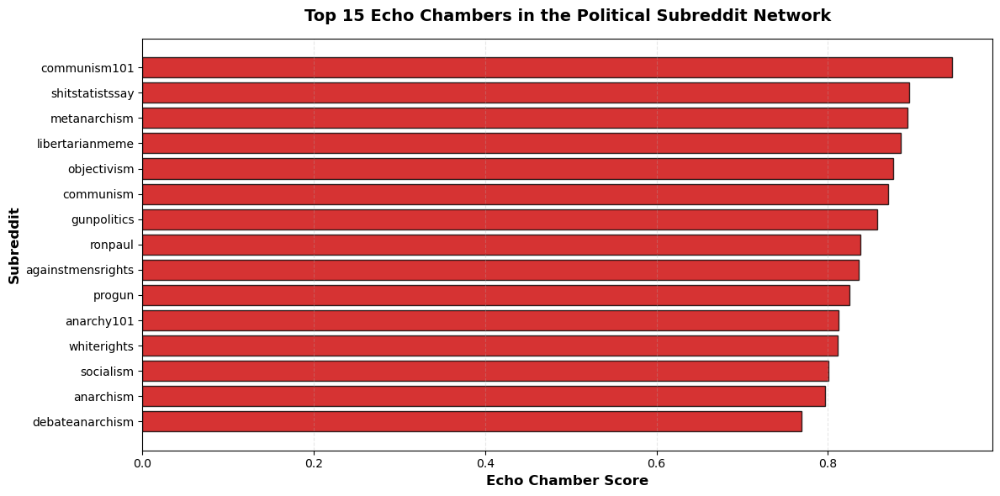


Top 5 echo chambers:
1. communism101: 0.945 (left)
2. shitstatistssay: 0.895 (right)
3. metanarchism: 0.893 (left)
4. libertarianmeme: 0.886 (right)
5. objectivism: 0.877 (right)


In [16]:
# Visualize the top echo chambers
plt.figure(figsize=(12, 6))
plt.barh(echo_score.index[:15], echo_score.values[:15], color='#CC0000', alpha=0.8, edgecolor='black')
plt.xlabel("Echo Chamber Score", fontsize=12, fontweight='bold')
plt.ylabel("Subreddit", fontsize=12, fontweight='bold')
plt.title("Top 15 Echo Chambers in the Political Subreddit Network", 
          fontsize=14, fontweight='bold', pad=15)
plt.gca().invert_yaxis()
plt.grid(axis='x', alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()

print(f"\nTop 5 echo chambers:")
for i, (sub, score) in enumerate(echo_score.head(5).items(), 1):
    orientation = dominant_ori.get(sub, 'unknown')
    print(f"{i}. {sub}: {score:.3f} ({orientation})")

## 6.5. Bridging Communities Analysis

Not all subreddits are equally isolated. Some act as "bridges" between different political communities, connecting users from different ideological backgrounds. These bridging subreddits have high betweenness centrality, meaning many paths in the network go through them.

We want to know: do bridging subreddits have different sentiment patterns than isolated ones? If bridging communities foster more cross-ideological interaction, they might have different emotional dynamics compared to echo chambers.

In [17]:
# Calculate betweenness centrality for identifying bridge communities
bet_centrality = nx.betweenness_centrality(G_left_right, normalized=True)

# Identify bridging vs non-bridging subreddits
# Threshold: top 25% betweenness centrality = "bridges"
threshold = np.percentile(list(bet_centrality.values()), 75)
bridging_subs = {s for s, bc in bet_centrality.items() if bc >= threshold}

print(f"Bridging subreddits (top 25% betweenness): {len(bridging_subs)}")
print(f"Non-bridging subreddits: {len(G_left_right.nodes()) - len(bridging_subs)}")
print(f"Bridging subreddits: {', '.join(sorted(bridging_subs))}")

# Mark each post by whether its subreddit is a bridge
df_lr_comm = df_left_right[df_left_right['subreddit'].isin(G_left_right.nodes())].copy()
df_lr_comm['is_bridge'] = df_lr_comm['subreddit'].apply(lambda s: s in bridging_subs)

# Compute subreddit-level mean sentiment
sub_sentiment = (
    df_lr_comm.groupby(['subreddit'])
    ['sentiment']
    .mean()
    .rename("mean_sentiment")
)

df_sub = pd.DataFrame(sub_sentiment)
df_sub['is_bridge'] = df_sub.index.map(lambda s: s in bridging_subs)

print(f"Mean sentiment for bridging subreddits: {df_sub[df_sub['is_bridge']]['mean_sentiment'].mean():.4f}")
print(f"Mean sentiment for non-bridging subreddits: {df_sub[~df_sub['is_bridge']]['mean_sentiment'].mean():.4f}")

Bridging subreddits (top 25% betweenness): 10
Non-bridging subreddits: 27
Bridging subreddits: anarchism, anarcho_capitalism, conservative, debateacommunist, enoughlibertarianspam, libertarian, occupywallstreet, republican, ronpaul, socialism
Mean sentiment for bridging subreddits: 0.1362
Mean sentiment for non-bridging subreddits: 0.0744


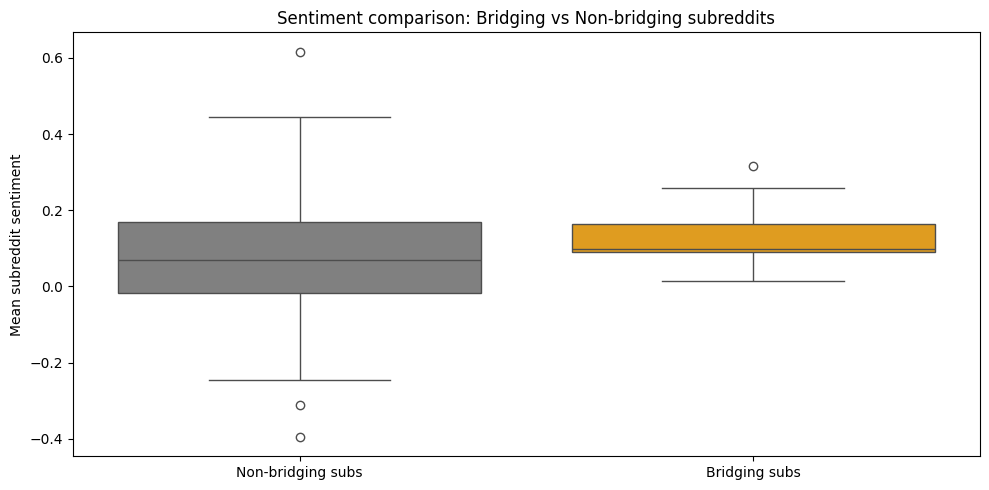

In [ ]:
# Boxplot comparison
plt.figure(figsize=(10, 5))
sns.boxplot(data=df_sub, x='is_bridge', y='mean_sentiment', palette=['grey', 'orange'])
plt.xticks([0, 1], ['Non-bridging subs', 'Bridging subs'])
plt.xlabel("")
plt.ylabel("Mean subreddit sentiment")
plt.title("Sentiment comparison: Bridging vs Non-bridging subreddits")
plt.tight_layout()
plt.show()

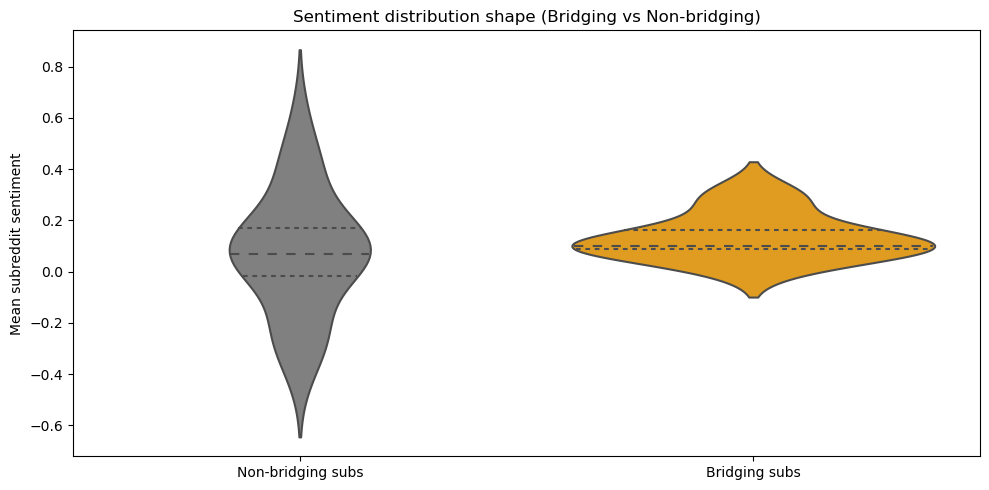

In [18]:
# Violin plot comparison
plt.figure(figsize=(10, 5))
sns.violinplot(
    data=df_sub,
    x='is_bridge',
    y='mean_sentiment',
    palette=['grey', 'orange'],
    inner='quartile'
)
plt.xticks([0, 1], ['Non-bridging subs', 'Bridging subs'])
plt.xlabel("")
plt.ylabel("Mean subreddit sentiment")
plt.title("Sentiment distribution shape (Bridging vs Non-bridging)")
plt.tight_layout()
plt.show()

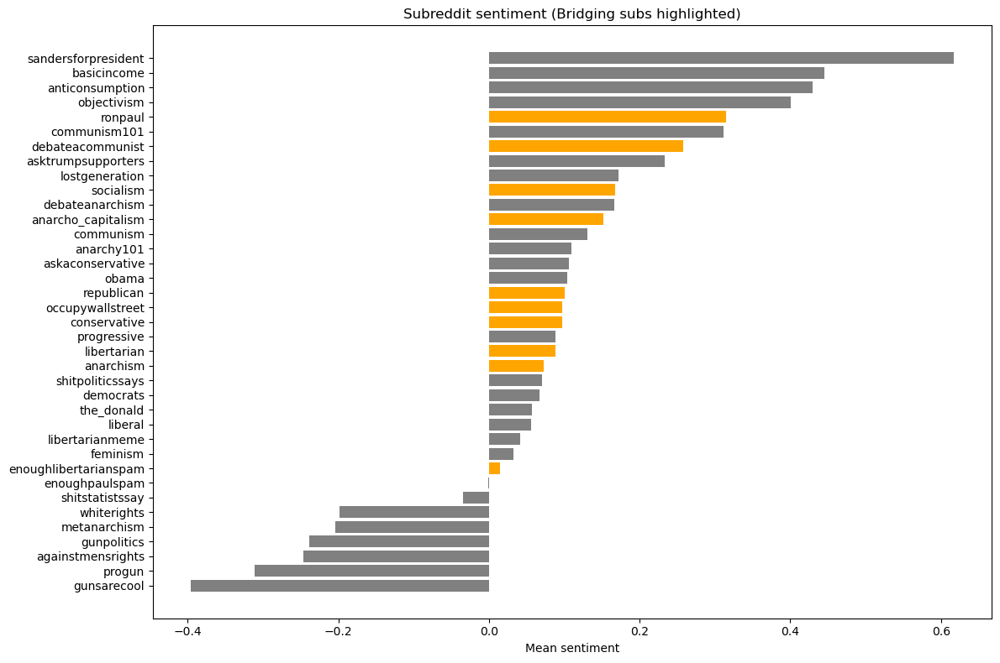

In [19]:
# Sorted bar chart with bridges highlighted
df_sorted = df_sub.sort_values('mean_sentiment')

plt.figure(figsize=(12, 8))
colors = ['orange' if is_b else 'grey' for is_b in df_sorted['is_bridge']]
plt.barh(df_sorted.index, df_sorted['mean_sentiment'], color=colors)
plt.xlabel("Mean sentiment")
plt.title("Subreddit sentiment (Bridging subs highlighted)")
plt.tight_layout()
plt.show()

## 6.6. Community Sentiment Distribution

Now let's look at how sentiment is distributed across the three communities we identified with the Louvain algorithm. This boxplot shows the sentiment of each subreddit, grouped by which community it belongs to.

This helps us see if certain communities tend to be more positive or negative overall, and how much variation exists within each community.

Community-level subreddit sentiment (mean, median ± std, n):
Community 1: mean=0.138, median=0.097, std=0.211, n=17
Community 0: mean=0.074, median=0.110, std=0.164, n=11
Community 2: mean=0.024, median=0.042, std=0.231, n=9


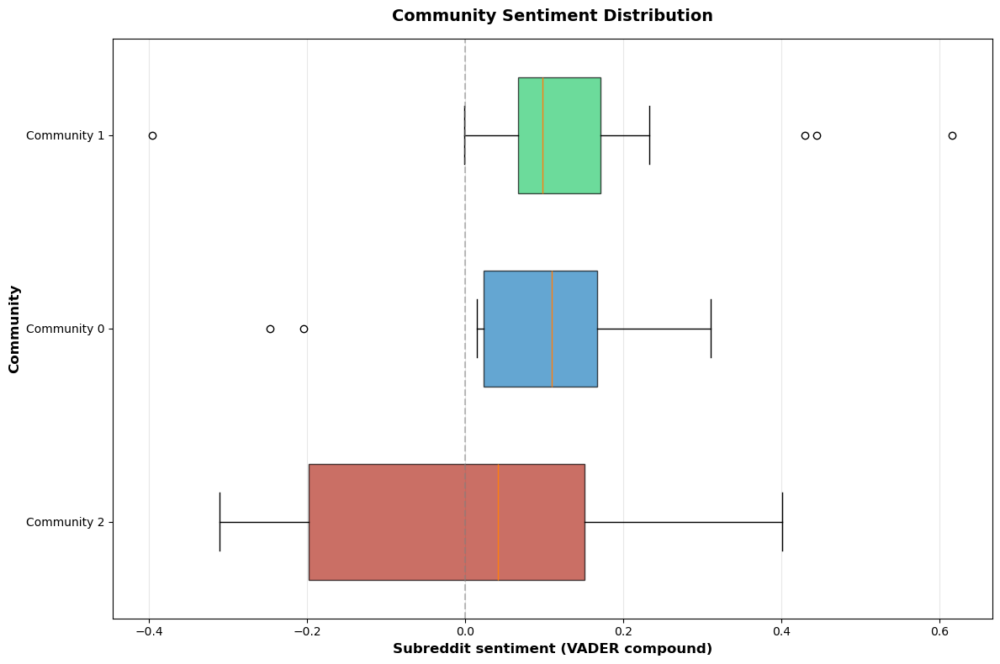

In [20]:
# Map subreddit sentiment to communities
sub_sent = df_left_right.groupby('subreddit')['sentiment'].mean()
sub_to_sent = sub_sent.to_dict()

# Use node_to_comm which was created during Louvain community detection
comm_sent = defaultdict(list)
for sub, cid in node_to_comm.items():
    if sub in sub_to_sent and not np.isnan(sub_to_sent[sub]):
        comm_sent[cid].append(sub_to_sent[sub])

# Calculate statistics
comm_sent_stats = {}
for cid, vals in comm_sent.items():
    vals = np.array(vals)
    comm_sent_stats[cid] = {
        'mean': float(np.mean(vals)),
        'median': float(np.median(vals)),
        'std': float(np.std(vals)),
        'n': len(vals)
    }

print("Community-level subreddit sentiment (mean, median ± std, n):")
for cid, stats in sorted(comm_sent_stats.items(), key=lambda x: x[1]['mean'], reverse=True):
    print(f"Community {cid}: mean={stats['mean']:.3f}, median={stats['median']:.3f}, std={stats['std']:.3f}, n={stats['n']}")

# Order communities by mean sentiment
cids = list(comm_sent_stats.keys())
means = [comm_sent_stats[cid]['mean'] for cid in cids]
order = np.argsort(means)
cids_ordered = np.array(cids)[order]

# Prepare data for boxplot
comm_sent_data = []
comm_labels = []
for cid in cids_ordered:
    if cid in comm_sent and len(comm_sent[cid]) > 0:
        comm_sent_data.append(comm_sent[cid])
        comm_labels.append(f"Community {cid}")

# Create boxplot
plt.figure(figsize=(12, 8))
bp = plt.boxplot(comm_sent_data, labels=comm_labels, vert=False, 
                 patch_artist=True, widths=0.6)

# Color boxplots with the same colors as in other community visualizations
colors_ordered = [global_colors[cid] for cid in cids_ordered]
for patch, color in zip(bp['boxes'], colors_ordered):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

plt.xlabel("Subreddit sentiment (VADER compound)", fontsize=12, fontweight='bold')
plt.ylabel("Community", fontsize=12, fontweight='bold')
plt.title("Community Sentiment Distribution", fontsize=14, fontweight='bold', pad=15)
plt.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
plt.grid(True, alpha=0.3, axis='x')
plt.tight_layout()
plt.show()

## 7. Network Visualization: Betweenness Centrality

Our first visualization shows the network with node sizes representing betweenness centrality. This measure identifies "bridge" subreddits - communities that connect different parts of the network.

Subreddits with high betweenness centrality are interesting because they might host more diverse political discussions or attract users from different ideological backgrounds. Colors show political orientation (blue for left, red for right).


Top bridging subreddits (betweenness):
libertarian                     0.1156
conservative                    0.0648
ronpaul                         0.0437
socialism                       0.0413
occupywallstreet                0.0367
anarcho_capitalism              0.0351
republican                      0.0307
anarchism                       0.0301
debateacommunist                0.0244
enoughlibertarianspam           0.0235
feminism                        0.0232
lostgeneration                  0.0217
progressive                     0.0213
progun                          0.0205
liberal                         0.0065


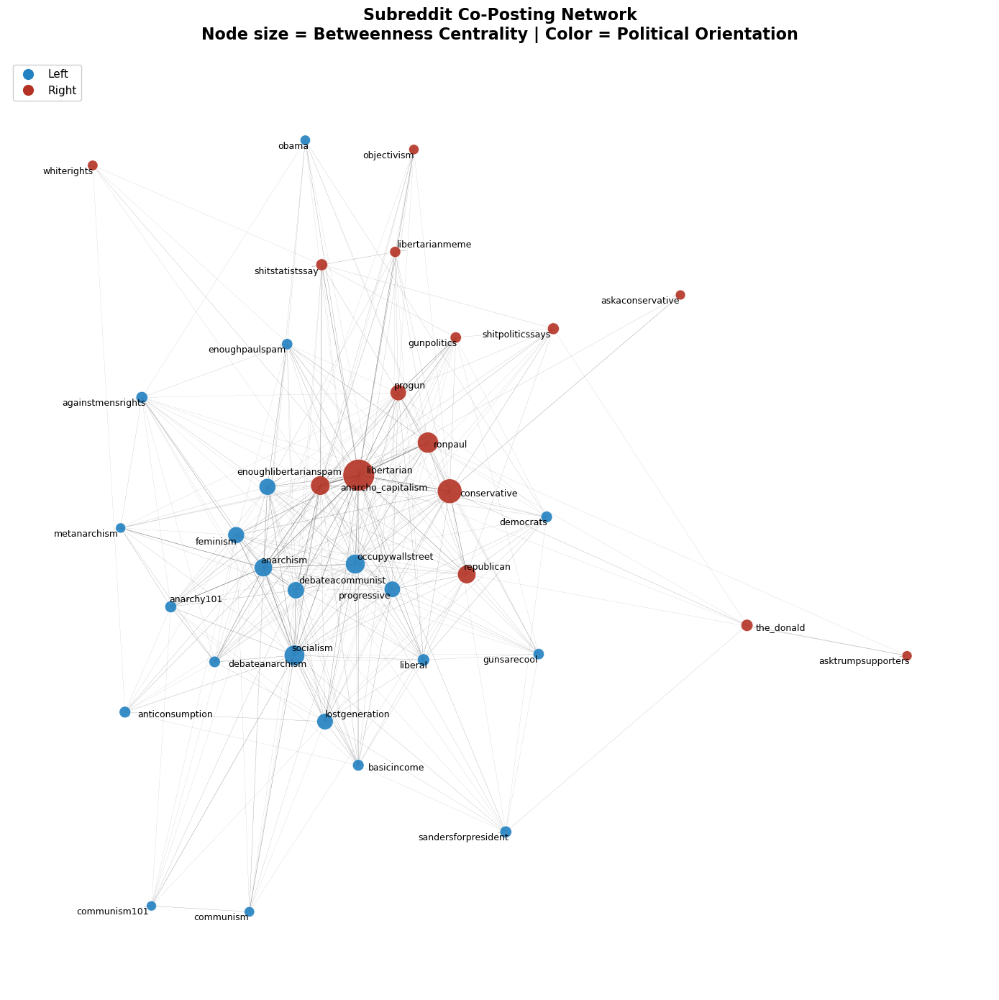

In [21]:
from adjustText import adjust_text

# Calculate betweenness centrality
bet_centrality = nx.betweenness_centrality(G_left_right, normalized=True)
max_bc = max(bet_centrality.values()) if bet_centrality else 1.0

node_sizes_bc = []
node_colors_lr = []

for node in G_left_right.nodes():
    ori = dominant_ori.get(node, None)
    node_colors_lr.append(color_map.get(ori, 'grey'))
    bc_norm = bet_centrality.get(node, 0.0) / max_bc if max_bc > 0 else 0.0
    node_sizes_bc.append(100 + 900 * bc_norm)

top_k = 15
top_bridge = sorted(bet_centrality.items(), key=lambda x: x[1], reverse=True)[:top_k]
print("\nTop bridging subreddits (betweenness):")
for sub, bc in top_bridge:
    print(f"{sub:30s}  {bc:.4f}")

fig, ax = plt.subplots(figsize=(14, 14))
pos = nx.spring_layout(G_left_right, k=0.25, iterations=50, seed=42)

nx.draw_networkx_nodes(
    G_left_right,
    pos,
    ax=ax,
    node_size=node_sizes_bc,
    node_color=node_colors_lr,
    alpha=0.9,
    linewidths=0.5,
    edgecolors='white'
)

nx.draw_networkx_edges(
    G_left_right,
    pos,
    ax=ax,
    width=[0.1 * np.sqrt(G_left_right[u][v]['weight']) for u, v in G_left_right.edges()],
    alpha=0.85,
    edge_color="grey"
)

# Create text objects for labels
texts = []
for node, (x, y) in pos.items():
    txt = ax.text(x, y, node, fontsize=9, ha='center', va='center')
    texts.append(txt)

# Automatically adjust text positions to avoid overlaps
adjust_text(texts, 
            arrowprops=dict(arrowstyle='->', color='gray', lw=0.5, alpha=0.7),
            ax=ax)

# Create legend
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='#2281C0', 
           markersize=12, label='Left', markeredgecolor='white'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='#B43224', 
           markersize=12, label='Right', markeredgecolor='white')
]
ax.legend(handles=legend_elements, loc='upper left', fontsize=11, framealpha=0.95)

ax.set_title(
    f"Subreddit Co-Posting Network\n"
    f"Node size = Betweenness Centrality | Color = Political Orientation",
    fontsize=16, fontweight='bold', pad=20
)
ax.axis("off")
plt.tight_layout()
plt.show()

## 8. Network Visualization: Louvain Communities

This visualization colors nodes by the communities detected by the Louvain algorithm. We label them as Community 0, 1, and 2 to avoid pre-judging their political nature.

The modularity score tells us how well-defined these communities are. Higher modularity means the algorithm found clear groupings with dense internal connections and sparse connections between groups.

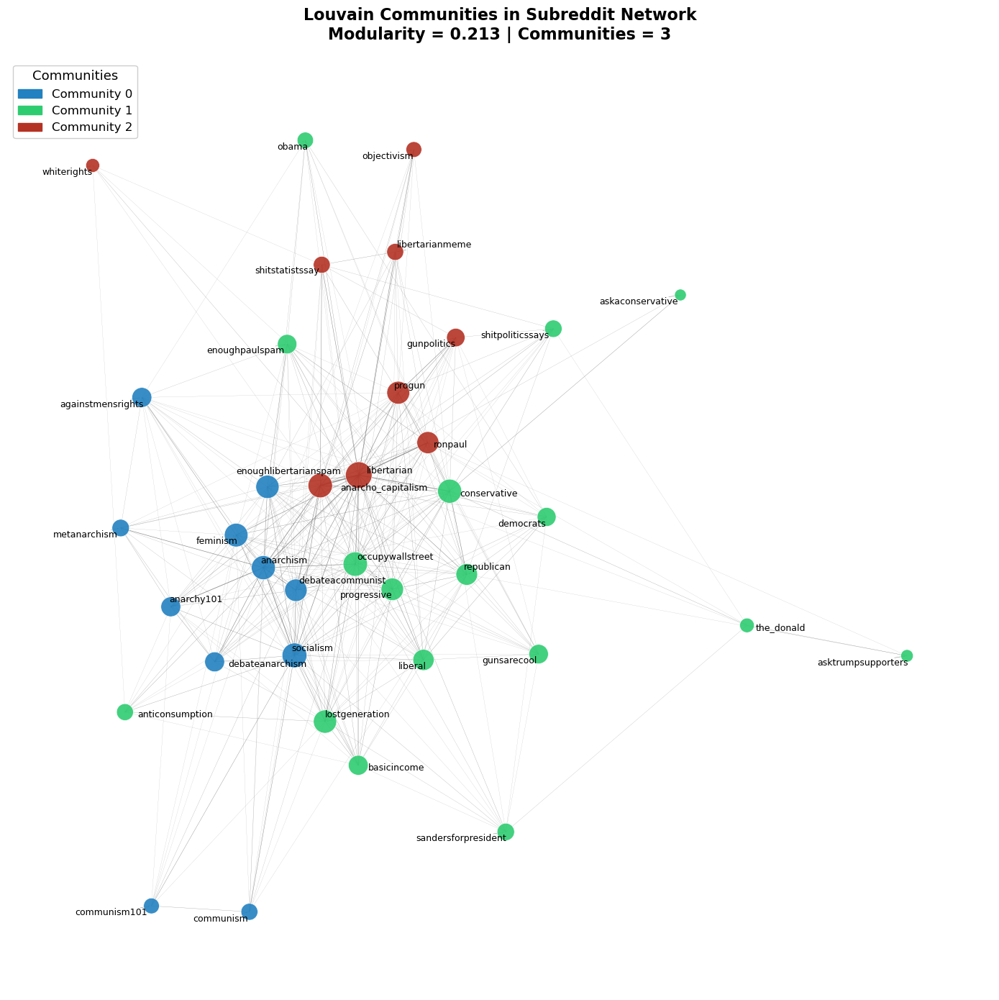

In [22]:
from adjustText import adjust_text

# Use same community colors as in the 4-panel figure
mapping = {0: 0, 1: 1, 2: 2}
partition_mapped = {n: mapping.get(node_to_comm[n], node_to_comm[n]) for n in G_left_right.nodes()}

# Define colors: 0=Blue (Left), 1=Green (Mixed), 2=Red (Right)
community_labels = {0: 'Community 0', 1: 'Community 1', 2: 'Community 2'}

# Build node colors and sizes
degrees = dict(G_left_right.degree(weight=None))
max_deg = max(degrees.values()) if degrees else 1

node_colors_comm = []
node_sizes_comm = []

for node in G_left_right.nodes():
    comm_id = partition_mapped[node]
    node_colors_comm.append(global_colors[comm_id])
    
    deg_norm = degrees[node] / max_deg if max_deg > 0 else 0
    node_sizes_comm.append(100 + 600 * deg_norm)

# Plot
fig, ax = plt.subplots(figsize=(14, 14))
pos = nx.spring_layout(G_left_right, k=0.25, iterations=50, seed=42)

nx.draw_networkx_nodes(
    G_left_right,
    pos,
    ax=ax,
    node_size=node_sizes_comm,
    node_color=node_colors_comm,
    alpha=0.9,
    linewidths=0.5,
    edgecolors='white'
)

nx.draw_networkx_edges(
    G_left_right,
    pos,
    ax=ax,
    width=[0.1 * np.sqrt(G_left_right[u][v]['weight']) for u, v in G_left_right.edges()],
    alpha=0.85,
    edge_color="grey"
)

# Create text objects for labels
texts = []
for node, (x, y) in pos.items():
    txt = ax.text(x, y, node, fontsize=9, ha='center', va='center')
    texts.append(txt)

# Automatically adjust text positions to avoid overlaps
adjust_text(texts, 
            arrowprops=dict(arrowstyle='->', color='gray', lw=0.5, alpha=0.7),
            ax=ax)

# Create legend
legend_patches = [
    mpatches.Patch(color=global_colors[0], label=community_labels[0]),
    mpatches.Patch(color=global_colors[1], label=community_labels[1]),
    mpatches.Patch(color=global_colors[2], label=community_labels[2])
]

ax.legend(handles=legend_patches, loc='upper left', fontsize=12, 
          framealpha=0.95, title='Communities', title_fontsize=13)

ax.set_title(
    f"Louvain Communities in Subreddit Network\n"
    f"Modularity = {mod:.3f} | Communities = {num_communities}",
    fontsize=16, fontweight='bold', pad=20
)

ax.axis("off")
plt.tight_layout()
plt.show()


## 9. Community-Orientation Analysis

Now we can answer the key question: do the network communities align with political orientations?

This matrix shows how many subreddits of each political leaning appear in each detected community. If we see strong diagonal patterns (e.g., Community 0 is mostly left, Community 2 is mostly right), it means the network structure does reflect political divisions.

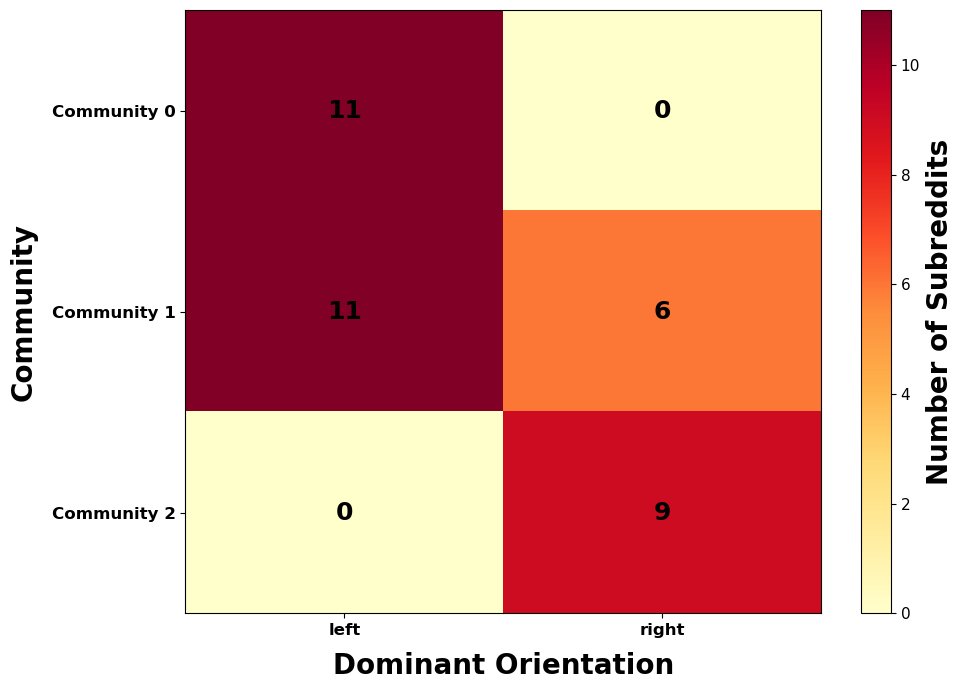


Community-Orientation Distribution:
dominant_orientation  left  right
community_id                     
Community 0             11      0
Community 1             11      6
Community 2              0      9


In [23]:
# Build dataframe mapping communities to orientations
rows = []
for node in G_left_right.nodes():
    cid = partition_mapped[node]
    ori = dominant_ori.get(node, None)
    rows.append((cid, node, ori))

df_comm = pd.DataFrame(rows, columns=['community_id', 'subreddit', 'dominant_orientation'])

comm_ori_ct = (
    df_comm
    .groupby(['community_id', 'dominant_orientation'])
    .size()
    .unstack(fill_value=0)
    .sort_index(axis=0)
    .sort_index(axis=1)
)

# Map community IDs to labels
comm_labels_map = {0: 'Community 0', 1: 'Community 1', 2: 'Community 2'}
comm_ori_ct.index = comm_ori_ct.index.map(comm_labels_map)

plt.figure(figsize=(10, 7))
im = plt.imshow(comm_ori_ct.values, cmap='YlOrRd', aspect='auto', vmin=0)

cbar = plt.colorbar(im, label="Number of Subreddits")
cbar.ax.tick_params(labelsize=11)
cbar.set_label("Number of Subreddits", fontsize=20, fontweight='bold')

plt.xticks(ticks=range(comm_ori_ct.shape[1]), labels=comm_ori_ct.columns, fontsize=12, fontweight='bold')
plt.yticks(ticks=range(comm_ori_ct.shape[0]), labels=comm_ori_ct.index, fontsize=12, fontweight='bold')

plt.xlabel("Dominant Orientation", fontsize=20, fontweight='bold', labelpad=10)
plt.ylabel("Community", fontsize=20, fontweight='bold', labelpad=10)
# plt.title("Community vs Political Orientation\nSubreddit Distribution", 
        #   fontsize=20, fontweight='bold', pad=15)

# Add text annotations
for i in range(comm_ori_ct.shape[0]):
    for j in range(comm_ori_ct.shape[1]):
        val = comm_ori_ct.values[i, j]
        plt.text(j, i, str(val), ha='center', va='center', 
                fontsize=18, fontweight='bold', color='black')

plt.tight_layout()
plt.show()

print("\nCommunity-Orientation Distribution:")
print(comm_ori_ct)

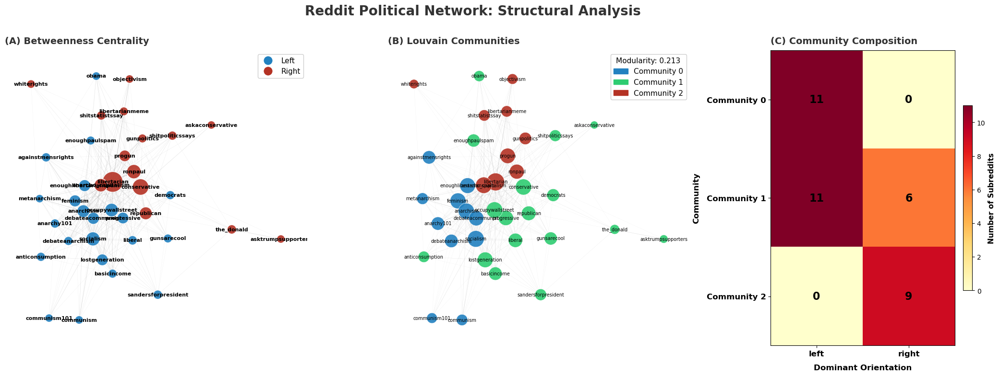


Community-Orientation Distribution:
dominant_orientation  left  right
community_id                     
Community 0             11      0
Community 1             11      6
Community 2              0      9


In [24]:
# Create improved 3-panel figure
fig = plt.figure(figsize=(26, 8))
fig.suptitle('Reddit Political Network: Structural Analysis',
             fontsize=20, fontweight='bold', y=1.00, color='#333333')

# Adjust grid spacing: give more space to network plots, less to matrix
gs = fig.add_gridspec(1, 3, wspace=0.3, width_ratios=[1.2, 1.2, 0.8])

# Calculate layout once for consistent positioning across panels
pos = nx.spring_layout(G_left_right, k=0.25, iterations=50, seed=42)

# ============================================================================
# PANEL A: NETWORK WITH BETWEENNESS CENTRALITY
# ============================================================================
ax1 = fig.add_subplot(gs[0, 0])
ax1.set_title('(A) Betweenness Centrality',
              fontsize=14, fontweight='bold', loc='left', pad=10, color='#333333')

# Calculate betweenness centrality
bet_centrality = nx.betweenness_centrality(G_left_right, normalized=True)
max_bc = max(bet_centrality.values()) if bet_centrality else 1.0

node_sizes_bc = []
node_colors_lr = []

for node in G_left_right.nodes():
    ori = dominant_ori.get(node, None)
    node_colors_lr.append(color_map.get(ori, 'grey'))
    bc_norm = bet_centrality.get(node, 0.0) / max_bc if max_bc > 0 else 0.0
    node_sizes_bc.append(150 + 800 * bc_norm)

# Draw network
nx.draw_networkx_nodes(
    G_left_right, pos, ax=ax1,
    node_size=node_sizes_bc,
    node_color=node_colors_lr,
    alpha=0.9,
    linewidths=1.0,
    edgecolors='white'
)

nx.draw_networkx_edges(
    G_left_right, pos, ax=ax1,
    width=[0.15 * np.sqrt(G_left_right[u][v]['weight']) for u, v in G_left_right.edges()],
    alpha=0.25,
    edge_color="grey"
)

nx.draw_networkx_labels(G_left_right, pos, ax=ax1, font_size=8, font_weight='bold')

# Legend - positioned to avoid overlap
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='#2281C0',
           markersize=14, label='Left', markeredgecolor='white', markeredgewidth=1),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='#B43224',
           markersize=14, label='Right', markeredgecolor='white', markeredgewidth=1)
]
ax1.legend(handles=legend_elements, loc='upper right', fontsize=11, framealpha=0.95)

ax1.axis("off")

# ============================================================================
# PANEL B: NETWORK WITH LOUVAIN COMMUNITIES
# ============================================================================
ax2 = fig.add_subplot(gs[0, 1])
ax2.set_title('(B) Louvain Communities',
              fontsize=14, fontweight='bold', loc='left', pad=10, color='#333333')

# Use same community colors as in the 4-panel figure
mapping = {0: 0, 1: 1, 2: 2}
partition_mapped = {n: mapping.get(node_to_comm[n], node_to_comm[n]) for n in G_left_right.nodes()}

# But use Community labels instead of Left/Mixed/Right
community_labels_proper = {0: 'Community 0', 1: 'Community 1', 2: 'Community 2'}

# Build node colors and sizes based on degree (exact same as original)
degrees = dict(G_left_right.degree(weight=None))
max_deg = max(degrees.values()) if degrees else 1

node_colors_comm = []
node_sizes_comm = []

for node in G_left_right.nodes():
    comm_id = partition_mapped[node]
    node_colors_comm.append(global_colors[comm_id])

    deg_norm = degrees[node] / max_deg if max_deg > 0 else 0
    node_sizes_comm.append(100 + 600 * deg_norm)

# Draw network with same parameters as original
nx.draw_networkx_nodes(
    G_left_right, pos, ax=ax2,
    node_size=node_sizes_comm,
    node_color=node_colors_comm,
    alpha=0.9,
    linewidths=0.5,
    edgecolors='white'
)

nx.draw_networkx_edges(
    G_left_right, pos, ax=ax2,
    width=[0.1 * np.sqrt(G_left_right[u][v]['weight']) for u, v in G_left_right.edges()],
    alpha=0.3,
    edge_color="grey"
)

nx.draw_networkx_labels(G_left_right, pos, ax=ax2, font_size=7)

# Legend - positioned to avoid overlap, with Community labels
legend_patches = [
    mpatches.Patch(color=global_colors[0], label=community_labels_proper[0]),
    mpatches.Patch(color=global_colors[1], label=community_labels_proper[1]),
    mpatches.Patch(color=global_colors[2], label=community_labels_proper[2])
]
ax2.legend(handles=legend_patches, loc='upper right', fontsize=11,
           framealpha=0.95, title=f'Modularity: {mod:.3f}', title_fontsize=11)

ax2.axis("off")

# ============================================================================
# PANEL C: COMMUNITY-ORIENTATION CONFUSION MATRIX
# ============================================================================
ax3 = fig.add_subplot(gs[0, 2])
ax3.set_title('(C) Community Composition',
              fontsize=14, fontweight='bold', loc='left', pad=10, color='#333333')

# Build dataframe mapping communities to orientations
rows = []
for node in G_left_right.nodes():
    cid = partition_mapped[node]
    ori = dominant_ori.get(node, None)
    rows.append((cid, node, ori))

df_comm = pd.DataFrame(rows, columns=['community_id', 'subreddit', 'dominant_orientation'])

comm_ori_ct = (
    df_comm
    .groupby(['community_id', 'dominant_orientation'])
    .size()
    .unstack(fill_value=0)
    .sort_index(axis=0)
    .sort_index(axis=1)
)

# Map community IDs to proper labels
comm_labels_for_matrix = {0: 'Community 0', 1: 'Community 1', 2: 'Community 2'}
comm_ori_ct.index = comm_ori_ct.index.map(comm_labels_for_matrix)

# Create heatmap
im = ax3.imshow(comm_ori_ct.values, cmap='YlOrRd', aspect='auto', vmin=0)

# Colorbar
cbar = plt.colorbar(im, ax=ax3, fraction=0.046, pad=0.04)
cbar.ax.tick_params(labelsize=10)
cbar.set_label("Number of Subreddits", fontsize=11, fontweight='bold')

# Set ticks and labels
ax3.set_xticks(range(comm_ori_ct.shape[1]))
ax3.set_xticklabels(comm_ori_ct.columns, fontsize=12, fontweight='bold')
ax3.set_yticks(range(comm_ori_ct.shape[0]))
ax3.set_yticklabels(comm_ori_ct.index, fontsize=12, fontweight='bold')

ax3.set_xlabel("Dominant Orientation", fontsize=12, fontweight='bold', labelpad=10)
ax3.set_ylabel("Community", fontsize=12, fontweight='bold', labelpad=10)

# Add text annotations
for i in range(comm_ori_ct.shape[0]):
    for j in range(comm_ori_ct.shape[1]):
        val = comm_ori_ct.values[i, j]
        ax3.text(j, i, str(val), ha='center', va='center',
                fontsize=16, fontweight='bold', color='black')

plt.tight_layout()
plt.savefig('improved_3panel_figure.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print("\nCommunity-Orientation Distribution:")
print(comm_ori_ct)

## 9.5. Combined Network Analysis Overview

This three-panel figure brings together our main network findings in one place. It makes it easier to see how betweenness centrality, community structure, and political orientation all relate to each other.

We use consistent colors and layout across panels so you can track individual subreddits and see patterns more clearly.

## 10. Comprehensive Analysis: Echo Chambers and Sentiment

This four-panel visualization explores the relationship between community structure, echo chamber behavior, and sentiment patterns.

We look at how echo chamber scores vary by community, how sentiment is distributed, whether there's a relationship between sentiment and echo chamber intensity, and map subreddits by their echo chamber characteristics. This helps us understand not just that echo chambers exist, but what they look like in terms of user behavior and emotional expression.

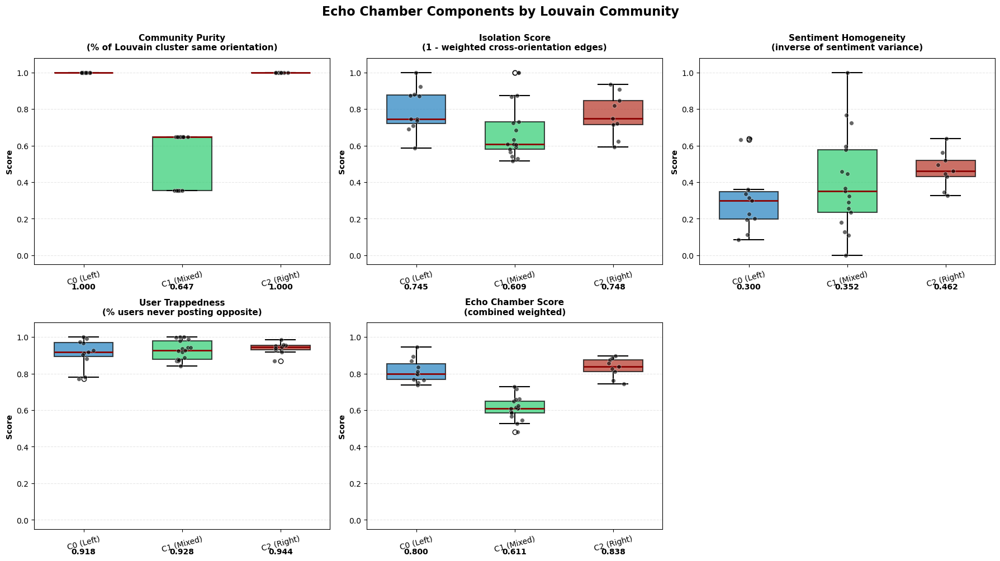


MEDIAN VALUES BY COMMUNITY
            community_purity  isolation_score  sent_homogeneity  \
community                                                         
C0 (Left)              1.000            0.745             0.300   
C1 (Mixed)             0.647            0.609             0.352   
C2 (Right)             1.000            0.748             0.462   

            user_trappedness  echo_chamber_score  
community                                         
C0 (Left)              0.918               0.800  
C1 (Mixed)             0.928               0.611  
C2 (Right)             0.944               0.838  

MEAN VALUES BY COMMUNITY
            community_purity  isolation_score  sent_homogeneity  \
community                                                         
C0 (Left)              1.000            0.796             0.309   
C1 (Mixed)             0.543            0.686             0.400   
C2 (Right)             1.000            0.768             0.469   

            user_tr

In [25]:
# Create community labels
comm_labels = {0: 'C0 (Left)', 1: 'C1 (Mixed)', 2: 'C2 (Right)'}
echo_components_df['community'] = echo_components_df['community_id'].map(comm_labels)

# Create 2x3 boxplot figure (4 components + combined score + 1 empty)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

components = ['community_purity', 'isolation_score', 'sent_homogeneity', 
              'user_trappedness', 'echo_chamber_score']
titles = ['Community Purity\n(% of Louvain cluster same orientation)', 
          'Isolation Score\n(1 - weighted cross-orientation edges)',
          'Sentiment Homogeneity\n(inverse of sentiment variance)',
          'User Trappedness\n(% users never posting opposite)',
          'Echo Chamber Score\n(combined weighted)']
colors = [global_colors[0], global_colors[1], global_colors[2]]

for idx, (component, title) in enumerate(zip(components, titles)):
    row = idx // 3
    col = idx % 3
    ax = axes[row, col]
    
    # Order by community
    order = ['C0 (Left)', 'C1 (Mixed)', 'C2 (Right)']
    
    bp = ax.boxplot(
        [echo_components_df[echo_components_df['community'] == comm][component].dropna() for comm in order],
        labels=order,
        patch_artist=True,
        widths=0.6
    )
    
    # Color boxplots
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
        patch.set_edgecolor('black')
        patch.set_linewidth(1.5)
    
    # Style whiskers, caps, medians
    for whisker in bp['whiskers']:
        whisker.set(linewidth=1.5, color='black')
    for cap in bp['caps']:
        cap.set(linewidth=1.5, color='black')
    for median in bp['medians']:
        median.set(linewidth=2, color='darkred')
    
    # Add individual points
    for i, comm in enumerate(order):
        data = echo_components_df[echo_components_df['community'] == comm][component].dropna()
        x = np.random.normal(i + 1, 0.04, size=len(data))
        ax.scatter(x, data, alpha=0.6, color='black', s=30, zorder=3, edgecolors='white', linewidths=0.5)
    
    # Add median values as text
    for i, comm in enumerate(order):
        median_val = echo_components_df[echo_components_df['community'] == comm][component].median()
        ax.text(i + 1, -0.09, f'{median_val:.3f}', ha='center', va='top', 
                fontsize=10, fontweight='bold', transform=ax.get_xaxis_transform())
    
    ax.set_title(title, fontsize=11, fontweight='bold', pad=10)
    ax.set_ylabel('Score', fontsize=10, fontweight='bold')
    ax.set_ylim(-0.05, 1.08)
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    ax.tick_params(axis='x', rotation=15)

# Remove the empty subplot
axes[1, 2].remove()

plt.suptitle('Echo Chamber Components by Louvain Community', fontsize=16, fontweight='bold', y=0.998)
plt.tight_layout()
plt.show()

# Print statistics
print("\n" + "="*80)
print("MEDIAN VALUES BY COMMUNITY")
print("="*80)
median_df = echo_components_df.groupby('community')[components].median().round(3)
print(median_df)

print("\n" + "="*80)
print("MEAN VALUES BY COMMUNITY")
print("="*80)
mean_df = echo_components_df.groupby('community')[components].mean().round(3)
print(mean_df)

print("\n" + "="*80)
print("RANGE (MAX - MIN) ACROSS COMMUNITIES FOR MEAN VALUES")
print("="*80)
range_df = mean_df.max() - mean_df.min()
print(range_df.round(3))

(-0.02, 1.02)

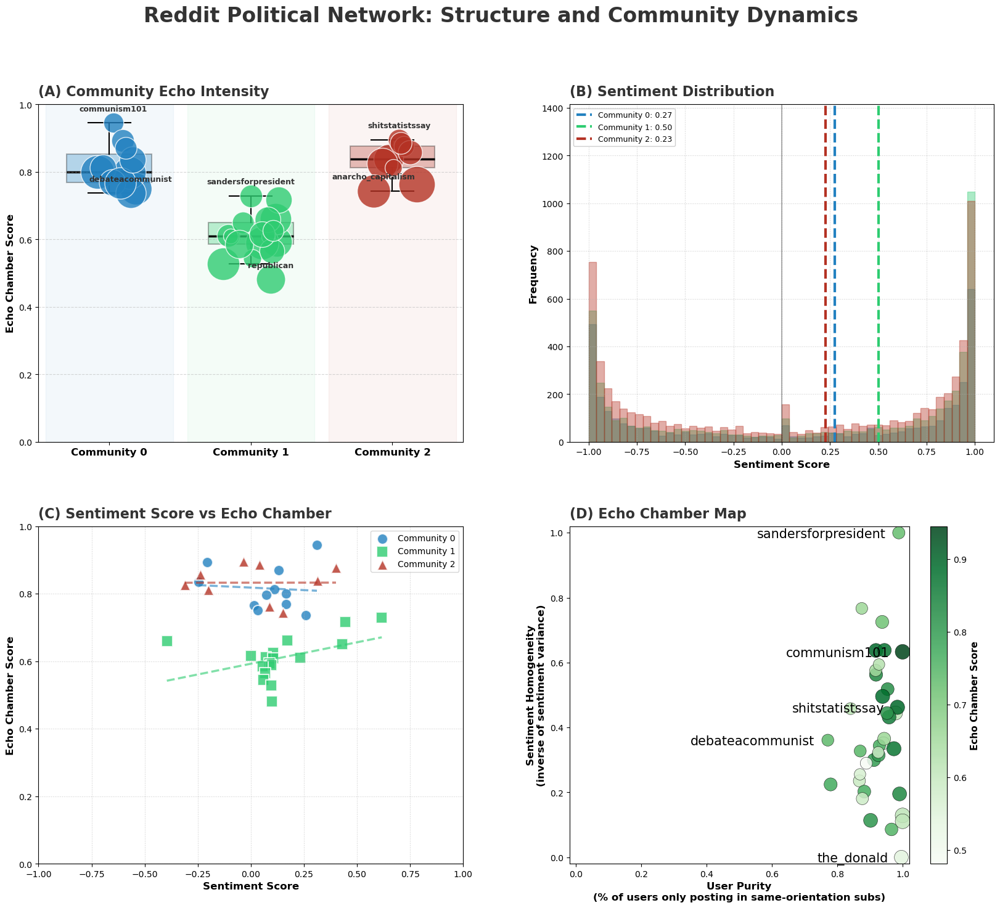

In [26]:
# Create 4-panel figure
fig = plt.figure(figsize=(20, 16))
fig.suptitle('Reddit Political Network: Structure and Community Dynamics', 
             fontsize=24, fontweight='bold', y=0.98, color='#333333')

gs = fig.add_gridspec(2, 2, wspace=0.25, hspace=0.25)

# ============================================================================
# PANEL A: STRATIFIED BEESWARM + BOX PLOT
# ============================================================================
ax_beeswarm = fig.add_subplot(gs[0, 0])
ax_beeswarm.set_title('(A) Community Echo Intensity', 
                      fontsize=16, fontweight='bold', loc='left', pad=10, color='#333333')

data_by_comm = {0: [], 1: [], 2: []}
plot_data = []
for n in G_left_right.nodes():
    comm = partition_mapped[n]
    echo = echo_metrics[n]['echo_score']
    degree = G_left_right.degree(n)
    data_by_comm[comm].append(echo)
    jitter_x = comm + np.random.uniform(-0.2, 0.2)
    plot_data.append({
        'node': n, 'x': jitter_x, 'comm': comm, 'y': echo,
        'size': degree * 50 + 150, 'color': global_colors[comm]
    })

for c in [0, 1, 2]:
    ax_beeswarm.axvspan(c - 0.45, c + 0.45, color=global_colors[c], alpha=0.05, zorder=0)

box_data = [data_by_comm[0], data_by_comm[1], data_by_comm[2]]
bp = ax_beeswarm.boxplot(box_data, positions=[0, 1, 2], widths=0.6, 
                         patch_artist=True, showfliers=False, zorder=1)

for i, box in enumerate(bp['boxes']):
    box.set(color='black', linewidth=1.5, facecolor=global_colors[i], alpha=0.3)
for element in ['whiskers', 'caps', 'medians']:
    plt.setp(bp[element], color='black', linewidth=1.5 if element != 'medians' else 2.5)

for d in plot_data:
    ax_beeswarm.scatter(d['x'], d['y'], s=d['size'], color=d['color'],
                        alpha=0.8, edgecolors='white', linewidth=1, zorder=2)

# Add labels to selected nodes
# For each community, label the highest and lowest echo score
for comm in [0, 1, 2]:
    comm_data = [d for d in plot_data if d['comm'] == comm]
    if len(comm_data) > 0:
        # Get highest and lowest echo scores in this community
        sorted_comm = sorted(comm_data, key=lambda x: x['y'], reverse=True)

        # Label top 1 and bottom 1 from each community
        to_label = [sorted_comm[0]]
        if len(sorted_comm) > 1:
            to_label.append(sorted_comm[-1])

        for d in to_label:
            ax_beeswarm.text(
                d['x'],
                d['y'] + 0.03,  # Offset above the point
                d['node'],
                fontsize=9,
                ha='center',
                va='bottom',
                fontweight='bold',
                color='#333333'
            )

ax_beeswarm.set_xticks([0, 1, 2])
ax_beeswarm.set_xticklabels([community_labels[0], community_labels[1], community_labels[2]], 
                            fontsize=12, fontweight='bold')
ax_beeswarm.set_ylabel('Echo Chamber Score', fontsize=12, fontweight='bold')
ax_beeswarm.grid(True, axis='y', linestyle='--', alpha=0.5)
ax_beeswarm.set_ylim(0, 1)

# ============================================================================
# PANEL B: SENTIMENT DISTRIBUTION
# ============================================================================
ax_sentiment = fig.add_subplot(gs[0, 1])
ax_sentiment.set_title('(B) Sentiment Distribution',
                        fontsize=16, fontweight='bold', loc='left', pad=10, color='#333333')

bins = np.linspace(-1, 1, 51)
max_h = 0

if 'sentiment' in df_left_right.columns:
    for comm in [0, 1, 2]:
        comm_nodes_names = [n for n, c in partition_mapped.items() if c == comm]
        sentiments = df_left_right[df_left_right['subreddit'].isin(comm_nodes_names)]['sentiment'].dropna().values
        color = global_colors[comm]
        
        if len(sentiments) > 0:
            counts, _, _ = ax_sentiment.hist(sentiments, bins=bins, alpha=0.4, color=color, edgecolor=color)
            max_h = max(max_h, max(counts))
            median = np.median(sentiments)
            ax_sentiment.axvline(median, color=color, linestyle='--', linewidth=3, 
                                 label=f"{community_labels[comm]}: {median:.2f}")

ax_sentiment.set_ylim(0, max_h * 1.35 if max_h > 0 else 1)
ax_sentiment.set_xlabel('Sentiment Score', fontsize=12, fontweight='bold')
ax_sentiment.set_ylabel('Frequency', fontsize=12, fontweight='bold')
ax_sentiment.grid(True, linestyle=':', alpha=0.6)
ax_sentiment.axvline(0, color='black', alpha=0.3)
ax_sentiment.legend(loc='upper left', fontsize=9, framealpha=0.95)

# ============================================================================
# PANEL C: SENTIMENT SCORE vs ECHO CHAMBER
# ============================================================================
ax_engagement = fig.add_subplot(gs[1, 0])
ax_engagement.set_title('(C) Sentiment Score vs Echo Chamber', 
                        fontsize=16, fontweight='bold', loc='left', pad=10, color='#333333')

markers = {0: 'o', 1: 's', 2: '^'}

for comm in [0, 1, 2]:
    comm_nodes_names = [n for n, c in partition_mapped.items() if c == comm]
    comm_data = echo_df[echo_df.index.isin(comm_nodes_names)].dropna()
    if comm_data.empty: continue

    ax_engagement.scatter(comm_data['sentiment_score'], comm_data['echo_score'],
                          s=150, c=global_colors[comm], marker=markers[comm],
                          alpha=0.8, edgecolors='white', linewidth=1.5, label=community_labels[comm])
    
    if len(comm_data) > 2:
        slope, intercept, _, _, _ = linregress(comm_data['sentiment_score'], comm_data['echo_score'])
        x_vals = np.array([comm_data['sentiment_score'].min(), comm_data['sentiment_score'].max()])
        ax_engagement.plot(x_vals, slope * x_vals + intercept, color=global_colors[comm], linestyle='--', lw=2.5, alpha=0.6)

ax_engagement.set_xlabel('Sentiment Score', fontsize=12, fontweight='bold')
ax_engagement.set_ylabel('Echo Chamber Score', fontsize=12, fontweight='bold')
ax_engagement.set_ylim(0, 1)
ax_engagement.set_xlim(-1, 1)
ax_engagement.grid(True, linestyle=':', alpha=0.6)
ax_engagement.legend(loc='upper right', fontsize=10)

# ============================================================================
# PANEL D: ECHO CHAMBER MAP
# ============================================================================
ax_map = fig.add_subplot(gs[1, 1])
ax_map.set_title('(D) Echo Chamber Map', 
                 fontsize=16, fontweight='bold', loc='left', pad=10, color='#333333')

# Use user purity (x-axis) vs sentiment homogeneity (y-axis)
sc = ax_map.scatter(
    sub_echo_df['user_purity'],
    sub_echo_df['sent_homogeneity'],
    c=sub_echo_df['echo_chamber_score'],
    cmap='Greens',
    s=50 + 250 * sub_echo_df['isolation_score'],  # Size by isolation score
    alpha=0.85,
    edgecolor='black',
    linewidths=0.4
)

# Label top 2 by echo score AND points in different corners
top_n = 2
top_subs = sub_echo_df.sort_values('echo_chamber_score', ascending=False).head(top_n)

# Add one from each corner if not already included
corners = [
    sub_echo_df.nlargest(1, 'user_purity'),  # Rightmost
    sub_echo_df.nlargest(1, 'sent_homogeneity'),  # Topmost
    sub_echo_df.nsmallest(1, 'user_purity'),  # Leftmost
    sub_echo_df.nsmallest(1, 'sent_homogeneity')  # Bottommost
]

labeled_subs = pd.concat([top_subs] + corners).drop_duplicates()

for idx, row in labeled_subs.iterrows():
    ax_map.text(
        row['user_purity'] - 0.04,
        row['sent_homogeneity'] - 0.015,
        idx,  # idx is the subreddit name (from index)
        fontsize=15,
        ha='right'
    )

ax_map.set_xlabel('User Purity\n(% of users only posting in same-orientation subs)', 
                  fontsize=12, fontweight='bold')
ax_map.set_ylabel('Sentiment Homogeneity\n(inverse of sentiment variance)', 
                  fontsize=12, fontweight='bold')

cbar = plt.colorbar(sc, ax=ax_map)
cbar.set_label('Echo Chamber Score', fontsize=11, fontweight='bold')

ax_map.set_xlim(-0.02, 1.02)
ax_map.set_ylim(-0.02, 1.02)

In [27]:
# Download required NLTK data
nltk.download('punkt', quiet=True)
nltk.download('stopwords', quiet=True)

# =========================================================
# 1. Build subreddit documents
# =========================================================

df_text = df_left_right.dropna(subset=['content']).copy()

sub_docs = (
    df_text.groupby('subreddit')['content']
           .apply(lambda s: " ".join(map(str, s)))
)

# Optional: restrict to same subs as echo analysis
if 'sub_echo_df' in globals():
    sub_docs = sub_docs[sub_docs.index.isin(sub_echo_df.index)]  # Changed: use .index instead of ['subreddit']

print("Subreddits with text:", len(sub_docs))

# =========================================================
# 2. NLTK tokenizer
# =========================================================

stop_words = set(stopwords.words('english'))
extra_stops = {
    'reddit','http','https','www','com','imgur',
    'one','two','said','like','think'
}
stop_words.update(extra_stops)

def nltk_tokenizer(text):
    text = text.lower()
    tokens = re.findall(r"[a-z']+", text)
    tokens = [t for t in tokens if t not in stop_words and len(t) > 2]
    return tokens

# =========================================================
# 3. TF-IDF + cosine similarity
# =========================================================

vectorizer = TfidfVectorizer(
    tokenizer=nltk_tokenizer,
    lowercase=False,
    min_df=3,
    max_df=0.8
)

tfidf_matrix = vectorizer.fit_transform(sub_docs.values)
cos_sim = cosine_similarity(tfidf_matrix)

sim_df = pd.DataFrame(
    cos_sim,
    index=sub_docs.index,
    columns=sub_docs.index
)

print("TF-IDF matrix shape:", tfidf_matrix.shape)

# =========================================================
# 4. Build SEMANTIC graph
# =========================================================

sim_threshold = 0.30  # tune between 0.15–0.30

G_semantic = nx.Graph()
subs = list(sim_df.index)
G_semantic.add_nodes_from(subs)

for i in range(len(subs)):
    for j in range(i+1, len(subs)):
        s = sim_df.iat[i, j]
        if s >= sim_threshold:
            G_semantic.add_edge(subs[i], subs[j], weight=float(s))

print("Semantic graph:", 
      G_semantic.number_of_nodes(), "nodes,", 
      G_semantic.number_of_edges(), "edges")

# Keep giant connected component
if G_semantic.number_of_edges() > 0:
    gcc_nodes = max(nx.connected_components(G_semantic), key=len)
    G_semantic_gcc = G_semantic.subgraph(gcc_nodes).copy()
else:
    G_semantic_gcc = G_semantic

print("Semantic GCC:",
      G_semantic_gcc.number_of_nodes(), "nodes,",
      G_semantic_gcc.number_of_edges(), "edges")

# =========================================================
# 5. NetworkX Louvain community detection on semantic graph
# =========================================================

communities_sem = nx.algorithms.community.louvain_communities(
    G_semantic_gcc,
    weight='weight',
    seed=42
)

# Convert to node → community mapping
sem_node_to_comm = {}
for cid, comm in enumerate(communities_sem):
    for node in comm:
        sem_node_to_comm[node] = cid

print("\nNumber of semantic communities:", len(communities_sem))

# Modularity
sem_modularity = nx.algorithms.community.modularity(
    G_semantic_gcc,
    communities_sem,
    weight='weight'
)

print(f"Semantic modularity (NetworkX Louvain): {sem_modularity:.4f}")

# =========================================================
# 6. Community dataframe with overlays
# =========================================================

sem_comm_df = pd.DataFrame({
    'subreddit': list(sem_node_to_comm.keys()),
    'sem_comm_id': list(sem_node_to_comm.values())
})

# Political side overlay
sub_dom_side = (
    df_left_right.groupby('subreddit')['Political orientation']
                 .agg(lambda s: s.value_counts().idxmax())
)

sem_comm_df['dom_side'] = sem_comm_df['subreddit'].map(sub_dom_side)

# Echo chamber overlay (if available)
if 'sub_echo_df' in globals():
    sem_comm_df['echo_chamber_score'] = sem_comm_df['subreddit'].map(
        sub_echo_df['echo_chamber_score']  # Changed: direct access since index is already subreddit
    )

print("\nSemantic community assignments (first 10):")
print(sem_comm_df.head(10))

# =========================================================
# 7. Semantic community summary
# =========================================================

def majority(s):
    vc = s.value_counts()
    return vc.index[0] if len(vc) > 0 else None

sem_summary = sem_comm_df.groupby('sem_comm_id').agg(
    num_subreddits=('subreddit', 'count'),
    dom_side=('dom_side', majority),
    mean_echo=('echo_chamber_score', 'mean')
)

print("\nSemantic community summary:")
print(sem_summary)

Subreddits with text: 37
TF-IDF matrix shape: (37, 20845)
Semantic graph: 37 nodes, 98 edges
Semantic GCC: 31 nodes, 98 edges

Number of semantic communities: 5
Semantic modularity (NetworkX Louvain): 0.3492

Semantic community assignments (first 10):
               subreddit  sem_comm_id dom_side  echo_chamber_score
0      againstmensrights            0     left            0.835960
1               feminism            0     left            0.751186
2       debateacommunist            1     left            0.736814
3            basicincome            1     left            0.717131
4              communism            1     left            0.870611
5             anarchy101            1     left            0.812511
6              anarchism            1     left            0.797012
7           communism101            1     left            0.944980
8  enoughlibertarianspam            1     left            0.766219
9        debateanarchism            1     left            0.769300

Semantic c

## 11. Semantic Text Analysis

So far we've looked at network structure based on who posts where. But what about the actual content? Do subreddits that use similar language cluster together, even if they don't share many users?

We build a semantic network using TF-IDF similarity - basically measuring how similar subreddits are based on the words they use. Then we run community detection again, but this time purely based on language patterns rather than user overlap.

This lets us see if "linguistic communities" match up with the "co-posting communities" we found earlier. If they don't match perfectly, it tells us something interesting about how ideology, social networks, and language all interact.

In [28]:
# =========================================================
# Semantic Analysis Visualizations
# =========================================================

# Prepare data for all visualizations
valid_subs = set(G_semantic_gcc.nodes())
sem_comm_df_valid = sem_comm_df[sem_comm_df['subreddit'].isin(valid_subs)].copy()

# Political orientation distribution across semantic communities
sem_ori_ct = pd.crosstab(
    sem_comm_df['sem_comm_id'], 
    sem_comm_df['dom_side']
).sort_index()

# Calculate layout for semantic network
pos_sem = nx.spring_layout(G_semantic_gcc, k=0.4, iterations=80, seed=42)
comm_ids = [sem_node_to_comm[n] for n in G_semantic_gcc.nodes()]
num_comms = len(set(comm_ids))
cmap_sem = plt.cm.get_cmap('tab10', num_comms)

# Prepare word cloud data
comm_texts = {}
for sem_id in sorted(sem_comm_df_valid['sem_comm_id'].unique()):
    comm_subs = sem_comm_df_valid.loc[sem_comm_df_valid['sem_comm_id'] == sem_id, 'subreddit']
    comm_posts = df_left_right[df_left_right['subreddit'].isin(comm_subs)]
    text = " ".join(comm_posts['content'].astype(str).tolist())
    comm_texts[sem_id] = text

# Build TF-IDF
comm_tf = {}
for sem_id, text in comm_texts.items():
    tokens = nltk_tokenizer(text)
    comm_tf[sem_id] = Counter(tokens)

N_docs = len(comm_tf)
df_counts = Counter()
for sem_id in comm_tf:
    df_counts.update(set(comm_tf[sem_id].keys()))

idf = {}
for term, dfc in df_counts.items():
    idf[term] = np.log(N_docs / dfc) if dfc > 0 else 0.0

comm_tfidf = {}
for sem_id in comm_tf:
    tfidf_map = {}
    for term, freq in comm_tf[sem_id].items():
        tfidf_score = freq * idf.get(term, 0.0)
        if tfidf_score > 0:
            tfidf_map[term] = tfidf_score
    comm_tfidf[sem_id] = tfidf_map

print(f"\n=== Semantic Analysis Summary ===")
print(f"Number of semantic communities: {len(communities_sem)}")
print(f"Semantic modularity: {sem_modularity:.4f}")
print(f"\nPolitical orientation by community:")
print(sem_ori_ct)


=== Semantic Analysis Summary ===
Number of semantic communities: 5
Semantic modularity: 0.3492

Political orientation by community:
dom_side     left  right
sem_comm_id             
0               2      0
1               9      2
2               2      3
3               5      4
4               2      2


## 12. Semantic Analysis Visualizations

These visualizations show what we found in the semantic analysis. First we present each component individually so you can examine them in detail, then we combine everything into one comprehensive figure.

The word clouds are particularly interesting - they show the distinctive vocabulary of each semantic community. By using TF-IDF weighting, we highlight words that are common in one community but rare in others, which helps identify each community's unique linguistic signature.

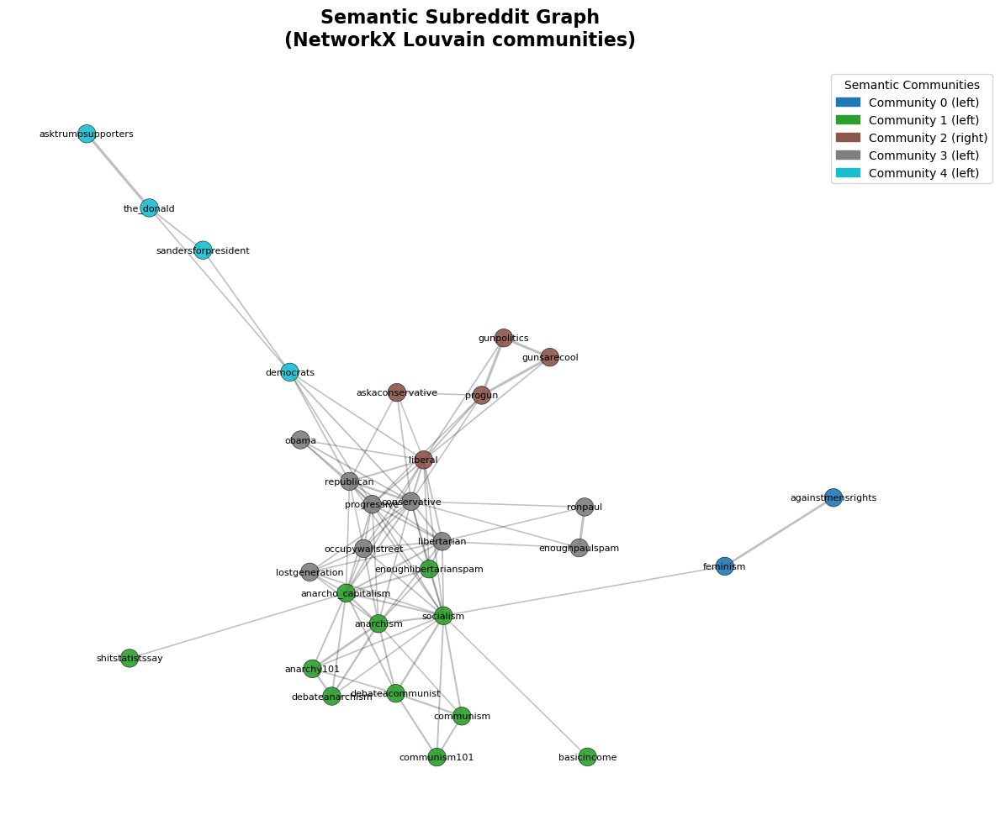

In [29]:
# =========================================================
# Individual Plot 2: Semantic Network Graph
# =========================================================

node_colors_sem = [cmap_sem(sem_node_to_comm[n]) for n in G_semantic_gcc.nodes()]

plt.figure(figsize=(12, 10))
nx.draw_networkx_nodes(
    G_semantic_gcc,
    pos_sem,
    node_size=240,
    node_color=node_colors_sem,
    edgecolors='black',
    linewidths=0.4,
    alpha=0.9
)

nx.draw_networkx_edges(
    G_semantic_gcc,
    pos_sem,
    alpha=0.25,
    width=[0.5 + 2*G_semantic_gcc[u][v]['weight'] for u,v in G_semantic_gcc.edges()]
)

# Label nodes
labels_sem = {n: n for n in G_semantic_gcc.nodes()}
nx.draw_networkx_labels(G_semantic_gcc, pos_sem, labels=labels_sem, font_size=8)

# Create legend for communities
legend_patches = []
for comm_id in sorted(set(comm_ids)):
    # Get dominant political side for this community
    comm_subs = [n for n in G_semantic_gcc.nodes() if sem_node_to_comm[n] == comm_id]
    sides = [sub_dom_side.get(s, 'unknown') for s in comm_subs if s in sub_dom_side.index]
    dom_side = max(set(sides), key=sides.count) if sides else 'mixed'
    
    patch = mpatches.Patch(
        color=cmap_sem(comm_id), 
        label=f'Community {comm_id} ({dom_side})'
    )
    legend_patches.append(patch)

plt.legend(
    handles=legend_patches, 
    loc='upper center',
    bbox_to_anchor=(1.0, 1.0),
    frameon=True, 
    fontsize=10, 
    title='Semantic Communities'
)

plt.title("Semantic Subreddit Graph\n(NetworkX Louvain communities)", 
          fontsize=16, fontweight='bold', pad=20)
plt.axis("off")
plt.tight_layout()
plt.show()

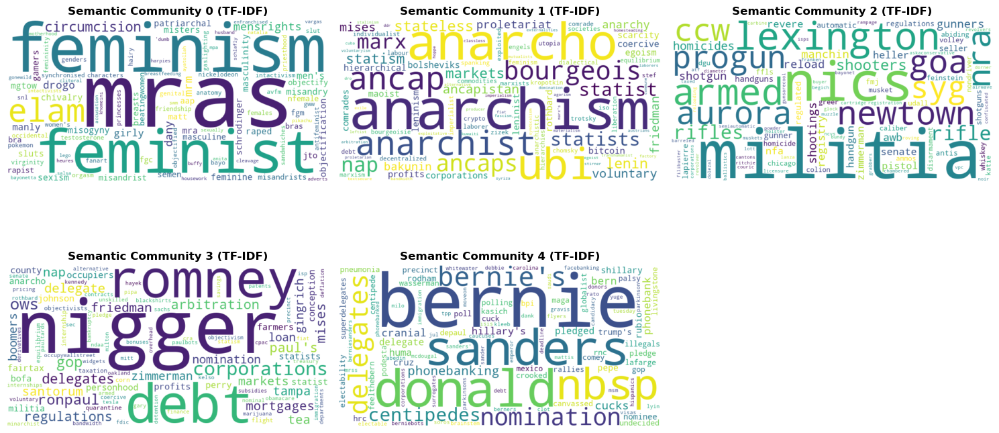


Top TF-IDF terms for Semantic Community 0:
[('mras', 110.87117855677276), ('feminism', 102.6460336045365), ('feminist', 80.33167847311552), ('elam', 67.5963923222322), ('circumcision', 56.810025376197615), ('mensrights', 36.26861928738534), ('mrm', 35.73533854309205), ('dany', 33.7981961611161), ('drogo', 32.18875824868201), ('girly', 30.579320336247907), ("men's", 26.5724312243505), ('manly', 25.751006598945605), ('misandry', 22.90726829685388), ('raped', 19.85977606696467), ('objectification', 19.242105369357258), ('mra', 18.74405831039362), ('patriarchal', 17.878896831809676), ('schrodinger', 17.703817036775103), ('feminine', 17.368071208043684), ('sexism', 16.95890989987994)]

Top TF-IDF terms for Semantic Community 1:
[('anarchism', 332.54748107165994), ('anarcho', 264.6076731107832), ('ubi', 188.75589076607596), ('anarchist', 178.2916975000536), ('ancap', 165.507502100181), ('bourgeois', 137.44360978112326), ('ancaps', 111.35998598098598), ('marx', 89.25742052568391), ('nap', 88

In [30]:
# =========================================================
# Individual Plot 3: Word Clouds per Semantic Community
# =========================================================

num_comms = len(comm_tfidf)
if num_comms == 0:
    print("No semantic communities to visualize.")
else:
    cols = min(3, num_comms)
    rows = math.ceil(num_comms / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 4 * rows))
    if rows == 1 and cols == 1:
        axes = [[axes]]
    elif rows == 1:
        axes = [axes]

    axes_flat = [ax for row in axes for ax in row]

    for ax, (sem_id, tfidf_freqs) in zip(axes_flat, sorted(comm_tfidf.items(), key=lambda x: x[0])):
        ax.set_axis_off()
        if len(tfidf_freqs) == 0:
            ax.set_title(f"Semantic Community {sem_id}\n(no sufficient text)", fontsize=12)
            continue

        wc = WordCloud(
            width=800,
            height=400,
            background_color='white',
            max_words=100,
            colormap='viridis'
        ).generate_from_frequencies(tfidf_freqs)

        ax.imshow(wc, interpolation='bilinear')
        ax.set_title(f"Semantic Community {sem_id} (TF-IDF)", fontsize=12, fontweight='bold')

    # Hide unused subplots if any
    for ax in axes_flat[len(comm_tfidf):]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.show()

# Print top TF-IDF terms per community
for sem_id in sorted(comm_tfidf.keys()):
    print(f"\nTop TF-IDF terms for Semantic Community {sem_id}:")
    top_terms = sorted(comm_tfidf[sem_id].items(), key=lambda x: x[1], reverse=True)[:20]
    print(top_terms)

# New dataset for differences in political and non-political posts

In [32]:
political_subreddits = [
    'Liberal', 'Libertarian', 'Feminism', 'politics', 'occupywallstreet',
    'moderatepolitics', 'democrats', 'socialism', 'communism101',
    'DebateAnarchism', 'ronpaul', 'TrueReddit', 'EnoughLibertarianSpam',
    'progressive', 'Anarcho_Capitalism', 'Conservative', 'badeconomics',
    'gunpolitics', 'Anarchism', 'immigration', 'worldnews',
    'SandersForPresident', 'PoliticalDiscussion', 'askaconservative',
    'NeutralPolitics', 'economy', 'lostgeneration', 'Republican',
    'BasicIncome', 'progun', 'EnoughPaulSpam', 'CanadaPolitics',
    'The_Donald', 'DebateaCommunist', 'Anarchy101', 'Anticonsumption',
    'AskTrumpSupporters', 'Debate', 'GaryJohnson', 'GunsAreCool',
    'LibertarianDebates', 'Objectivism', 'POLITIC',
    'RadicalChristianity', 'ShitPoliticsSays', 'Shitstatistssay',
    'TheAgora', 'WhiteRights', 'againstmensrights', 'communism',
    'conservatives', 'libertarianmeme', 'metanarchism', 'obama'
]

output_file = "reddit_dataset_political_users.csv"

if os.path.exists(output_file):
    df_filtered = pd.read_csv("reddit_dataset_filtered.csv")
    # find only political users through subreddits
    df_political = df_filtered[df_filtered["subreddit"].isin(political_subreddits)]

    users = set(df_political["author"].unique())
    print("unique politically active users:", len(users))


    political_user_df = df_filtered[df_filtered["author"].isin(users)]
    political_user_df.to_csv("reddit_dataset_political_users.csv", index=False)

else:
    political_user_df = pd.read_csv(output_file)
print("posts by politically active users: ", len(political_user_df))

unique politically active users: 38871
posts by politically active users:  364378


In [33]:
political_user_df.head()

,author,content,id,subreddit,subreddit_id,summary
10,Darkjediben,As soon as yall walk around with fishbowls aro...,c31zubn,askreddit,t5_2qh1i,"Fuck off, inconsiderate smokers fucking suck a..."
15,ttmlkr,"I've had this problem for several weeks now, a...",t3_tfh6d,health,t5_2qh9z,"Pressure located around right ear, doesn't alw..."
20,squeakyneb,This is perfectly possible on any platform. QR...,cau02ko,gaming,t5_2qh03,"no, that's fucking silly."
26,BackOff_ImAScientist,He seems to be start out by saying that white ...,ckbqvcq,nba,t5_2qo4s,he said somethings that equate to that he want...
46,somadrop,"I figure, if I eat no meat, then someone else ...",c8helj1,worldnews,t5_2qh13,I'm an optimist.


Add political orientations for subreddits

In [34]:
df = political_user_df.copy()
df_reddit_affiliation_only_political = pd.read_csv("subreddit_political_classification_only_political.csv")

# Ensure lowercase matching
df['subreddit'] = df['subreddit'].str.lower()

# Merge with political labels
df = df.merge(
    df_reddit_affiliation_only_political[['subreddit', 'Political orientation ']],
    on='subreddit',
    how='left'
)

# Assign political orientation only if subreddit is in list, else non-political
df['Political orientation '] = df['Political orientation '].fillna('non-political')

# remove labels for subreddits considered non-political after manual filtering
df['Political orientation '] = df.apply(
    lambda row: row['Political orientation '] 
    if row['subreddit'] in political_subreddits 
    else 'non-political',
    axis=1
)

# Clean column name
df.rename(columns={'Political orientation ': 'political orientation'}, inplace=True)

print("Posts in full dataset:", len(df))
df.head()

Posts in full dataset: 364378


,author,content,id,subreddit,subreddit_id,summary,political orientation
0,Darkjediben,As soon as yall walk around with fishbowls aro...,c31zubn,askreddit,t5_2qh1i,"Fuck off, inconsiderate smokers fucking suck a...",non-political
1,ttmlkr,"I've had this problem for several weeks now, a...",t3_tfh6d,health,t5_2qh9z,"Pressure located around right ear, doesn't alw...",non-political
2,squeakyneb,This is perfectly possible on any platform. QR...,cau02ko,gaming,t5_2qh03,"no, that's fucking silly.",non-political
3,BackOff_ImAScientist,He seems to be start out by saying that white ...,ckbqvcq,nba,t5_2qo4s,he said somethings that equate to that he want...,non-political
4,somadrop,"I figure, if I eat no meat, then someone else ...",c8helj1,worldnews,t5_2qh13,I'm an optimist.,centrist


### Assign each user a political orientation

In [35]:
# Filter to political orientations only
political_df = df[df['political orientation'].isin(['left', 'right', 'centrist'])]

# Count number of posts per author per orientation
counts = political_df.groupby(['author', 'political orientation']).size().reset_index(name='count')

# Function to assign orientation (with "mixed" for ties)
def assign_orientation(sub_df):
    sub_df = sub_df.sort_values('count', ascending=False)
    if len(sub_df) > 1 and sub_df.iloc[0]['count'] == sub_df.iloc[1]['count']:
        return 'mixed'
    else:
        return sub_df.iloc[0]['political orientation']

# Apply per author
author_orientations = counts.groupby('author').apply(assign_orientation).reset_index()
author_orientations.columns = ['author', 'author orientation']

# Merge directly into df
df = df.merge(author_orientations, on='author', how='left')
df['author orientation'] = df['author orientation'].fillna('unknown')

### add clean content

In [36]:
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# ==========================================
# TEXT CLEANING + LEMMATIZATION
# ==========================================
stop_words = set(stopwords.words('english')) | {
    "http", "https", "www", "reddit", "people", "think",
    "say", "said", "u", "im", "dont", "amp", "politics",
    "political", "government", "party", "vote"
}

lemm = WordNetLemmatizer()

def clean_text(text):
    text = text.lower()
    text = re.sub(r"http\S+|www\S+", "", text)
    text = re.sub(r"[^a-z\s]", " ", text)
    tokens = nltk.word_tokenize(text)
    tokens = [lemm.lemmatize(t) for t in tokens if t not in stop_words and len(t) > 2]
    return " ".join(tokens)

df["clean_content"] = df["content"].astype(str).apply(clean_text)
df['clean_content'] = df['clean_content'].fillna("")

## Sentiment analysis using labmt
When determining the sentiment of each post we found that just taking the average word score of a post based on LabMTs scoring was insufficient to properly capture negative sentiment in particular. Upon reviewing some of the given scores we deemed that this method seemed to have a bias towards slightly positive values, as even posts which had lots of swearing and criticism resulted in slightly above average sentiment, likely due to the mass of neutral/slightly positive filler words diluting the negative sentiment scores. Therefore, we attempted to introduce a new measure which attributes higher importance to emotionally loaded words.  
  
In order to do so we filtered out some of the neutral filler words by excluding words with sentiment scores between $4.7$ and $5.3$. We also subtracted the sentiment score by the mean value (5) and applied a weight based on how far from neutral the sentiment of the word is, in order to more accurately capture the tone of a post. The used sentiment score was calculated as  
$$s_{lab} = \text{labmt score}, w = |s_{lab} - 5|$$
$$\text{sentiment}_{scaled} = \frac{\sum_{i \in words}(\textbf{s}_{lab_i} - 5) \cdot w_i}{\sum \textbf{w}}$$

In [37]:
df = df.copy()  # avoid modifying original

df['subreddit'] = df['subreddit'].astype(str).str.lower().str.strip()
political_subreddits = [s.lower().strip() for s in political_subreddits]

# Define political subreddits: anything not "non-political"
df['in_political_sub'] = df['subreddit'].isin(political_subreddits)

# use labmt
labmt = pd.read_csv("labmt.csv")
labmt.columns = ['word', 'score']  # assigns columns t odataset
labmt['word'] = labmt['word'].str.lower()
labmt_dict = dict(zip(labmt['word'], labmt['score']))

def user_emotion_score(text, neutral_low=4.7, neutral_high=5.3):
    words = nltk.word_tokenize(text.lower())
    
    # Filter out words not in LabMT
    scores = [labmt_dict[w] for w in words if w in labmt_dict]
    
    # Remove words inside neutral range
    filtered_scores = [s for s in scores if s < neutral_low or s > neutral_high]
    
    if len(filtered_scores) == 0:
        return 0.0  # No emotional signal
    
    # Weight stronger emotions more heavily (distance from neutral midpoint 5)
    weights = [abs(s - 5.0) for s in filtered_scores]
    
    # Weighted mean centered at 5.0
    signal = np.sum((np.array(filtered_scores) - 5.0) * weights) / (np.sum(weights) + 1e-9)
    
    return signal

df["sentiment"] = df["clean_content"].apply(user_emotion_score)

# Save updated dataframe to CSV
df.to_csv("df_with_sentiment.csv", index=False)

In [38]:
print("Total politically active user posts:", len(df))

print("centrist users:", df[df['author orientation'] == 'centrist']['author'].nunique())
print("Right-oriented users:", df[df['author orientation'] == 'right']['author'].nunique())
print("Left-oriented users:", df[df['author orientation'] == 'left']['author'].nunique())

print("centrist user posts:", (df['author orientation'] == 'centrist').sum())
print("Right-oriented user posts:", (df['author orientation'] == 'right').sum())
print("left-oriented user posts:", (df['author orientation'] == 'left').sum())
df.head(20)

Total politically active user posts: 364378
centrist users: 36293
Right-oriented users: 666
Left-oriented users: 1564
centrist user posts: 341942
Right-oriented user posts: 5618
left-oriented user posts: 11800


,author,content,id,subreddit,subreddit_id,summary,political orientation,author orientation,clean_content,in_political_sub,sentiment
0,Darkjediben,As soon as yall walk around with fishbowls aro...,c31zubn,askreddit,t5_2qh1i,"Fuck off, inconsiderate smokers fucking suck a...",non-political,centrist,soon yall walk around fishbowl around head nob...,False,-0.126228
1,ttmlkr,"I've had this problem for several weeks now, a...",t3_tfh6d,health,t5_2qh9z,"Pressure located around right ear, doesn't alw...",non-political,centrist,problem several week mainly become annoyance a...,False,0.780315
2,squeakyneb,This is perfectly possible on any platform. QR...,cau02ko,gaming,t5_2qh03,"no, that's fucking silly.",non-political,left,perfectly possible platform qrs used like barc...,False,0.821664
3,BackOff_ImAScientist,He seems to be start out by saying that white ...,ckbqvcq,nba,t5_2qo4s,he said somethings that equate to that he want...,non-political,centrist,seems start saying white terrified black accur...,False,0.847919
4,somadrop,"I figure, if I eat no meat, then someone else ...",c8helj1,worldnews,t5_2qh13,I'm an optimist.,centrist,centrist,figure eat meat someone else get eat one third...,True,0.695708
5,jehilla,"first of all, im very liberal when it comes to...",cdm5bwh,sex,t5_2qh3p,She and her brother needs a good lesson in sex...,non-political,mixed,first liberal come sex second sweden legal age...,False,1.290673
6,redditallreddy,"Ok, the first thing that went through my mind ...",c5k8dqr,politics,t5_2cneq,"reddit prefers liberal-leaning posts, it doesn...",centrist,centrist,first thing went mind saw length post holy shi...,True,0.750459
7,st31r,"So I\'m playing Metro, and I want to blow up t...",t3_oeik1,battlefield3,t5_2rlua,NO AMERICAN LIVES WERE HARMED IN THIS POST.,non-political,centrist,playing metro want blow booth infested dirty r...,False,0.902185
8,EnigmaGuy,Suppose a bit of back story would help. I was ...,t3_x3f0q,askreddit,t5_2qh1i,"People are two-faced, never take a supervisory...",non-political,centrist,suppose bit back story would help recently pro...,False,0.839724
9,Koyoteelaughter,"First of all, congratulations on your success....",ch3wq4c,confession,t5_2qo2a,Pay the Iron Price and read it.,non-political,centrist,first congratulation success getting point lik...,False,0.922262


Look into how many left- and right oriented users and posts are in the dataset

In [39]:
# Count posts by political orientation in non-political subreddits
non_pol_posts = df[df['in_political_sub'] == False]

print("Left-oriented posts in non-political subs:", 
      (non_pol_posts['author orientation'] == 'left').sum())

print("Right-oriented posts in non-political subs:", 
      (non_pol_posts['author orientation'] == 'right').sum())


# Count posts inside political subreddits for comparison
pol_posts = df[df['in_political_sub'] == True]

print("Left-oriented posts in political subs:", 
      (pol_posts['author orientation'] == 'left').sum())

print("Right-oriented posts in political subs:", 
      (pol_posts['author orientation'] == 'right').sum())


Left-oriented posts in non-political subs: 8925
Right-oriented posts in non-political subs: 4288
Left-oriented posts in political subs: 2875
Right-oriented posts in political subs: 1330


### Review results from sentiment analysis

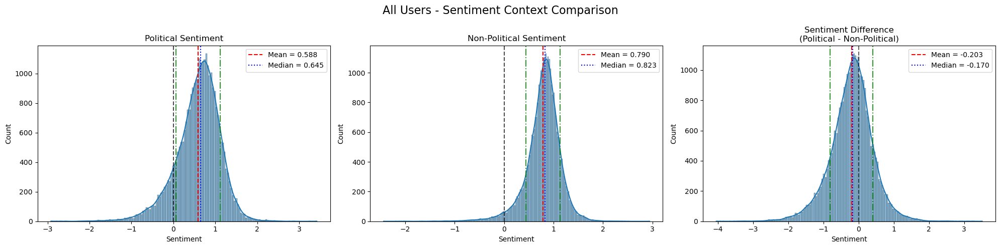

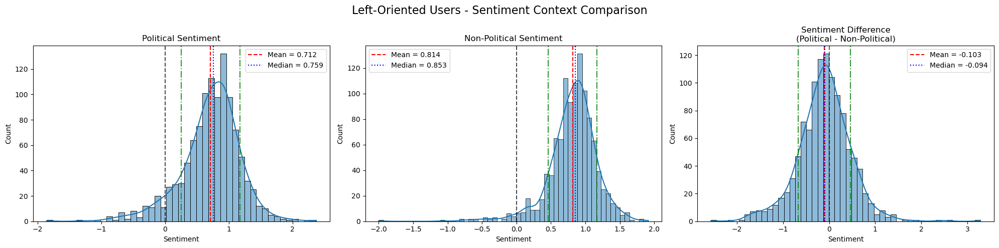

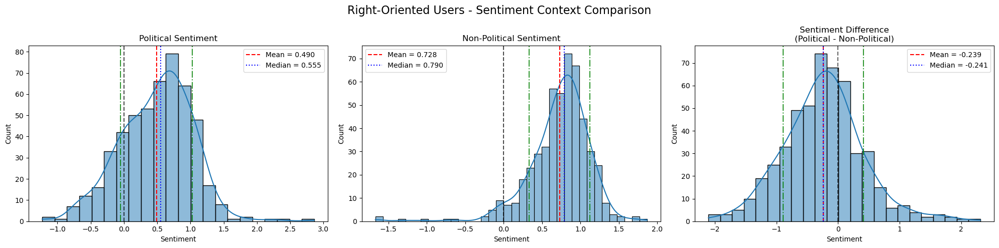

In [40]:
# --- PER-USER SENTIMENT COMPARISON ---
political_posts = df[df['in_political_sub']]
nonpolitical_posts = df[~df['in_political_sub']]

polit_sent_user = political_posts.groupby('author')['sentiment'].median().rename("political_sent")
nonpolit_sent_user = nonpolitical_posts.groupby('author')['sentiment'].median().rename("nonpolit_sent")

user_sent_df = pd.concat([polit_sent_user, nonpolit_sent_user], axis=1).dropna()
user_sent_df['sent_diff'] = user_sent_df['political_sent'] - user_sent_df['nonpolit_sent']

# Merge author orientation
user_sent_df = user_sent_df.merge(
    df[['author', 'author orientation']].drop_duplicates('author'),
    on='author',
    how='left'
)

left_users = user_sent_df[user_sent_df['author orientation'] == 'left']
right_users = user_sent_df[user_sent_df['author orientation'] == 'right']


# ==========================
# PLOTTING FUNCTION
# ==========================
def plot_sentiment_triplet(data, title):
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))
    
    cols = ['political_sent', 'nonpolit_sent', 'sent_diff']
    titles = [
        "Political Sentiment",
        "Non-Political Sentiment",
        "Sentiment Difference\n(Political - Non-Political)"
    ]
    
    for i, (col, t) in enumerate(zip(cols, titles)):
        sns.histplot(data[col], kde=True, ax=axes[i])
        
        # Compute statistics
        mean_val = data[col].mean()
        median_val = data[col].median()
        std_val = data[col].std()
        
        # Plot mean
        axes[i].axvline(mean_val, color='red', linestyle='--', label=f"Mean = {mean_val:.3f}")
        # Plot median
        axes[i].axvline(median_val, color='blue', linestyle=':', label=f"Median = {median_val:.3f}")
        # Plot standard deviation
        axes[i].axvline(mean_val + std_val, color='green', linestyle='-.', alpha=0.8)
        axes[i].axvline(mean_val - std_val, color='green', linestyle='-.', alpha=0.8)
        
        # Reference zero line where appropriate
        if col != 'sent_diff':
            axes[i].axvline(0, color='black', linestyle='--', alpha=0.7)
        else:
            axes[i].axvline(0, color='black', linestyle='--', alpha=0.6)
        
        axes[i].set_title(t)
        axes[i].set_xlabel("Sentiment")
        axes[i].legend()
    
    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()





# ==========================
# RUN THREE FIGURES
# ==========================
plot_sentiment_triplet(user_sent_df, "All Users - Sentiment Context Comparison")
plot_sentiment_triplet(left_users, "Left-Oriented Users - Sentiment Context Comparison")
plot_sentiment_triplet(right_users, "Right-Oriented Users - Sentiment Context Comparison")


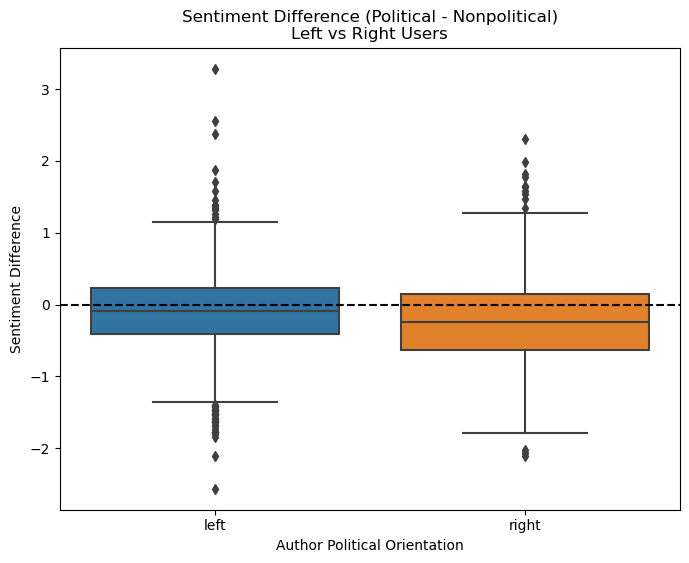

In [41]:
# Filter only political orientations of interest
subset = user_sent_df[user_sent_df['author orientation'].isin(['left', 'right'])]

plt.figure(figsize=(8, 6))
sns.boxplot(
    data=subset,
    x='author orientation',
    y='sent_diff'
)

plt.axhline(0, color='black', linestyle='--')
plt.title("Sentiment Difference (Political - Nonpolitical)\nLeft vs Right Users")
plt.xlabel("Author Political Orientation")
plt.ylabel("Sentiment Difference")
plt.show()


## Topics across political orientation analysis
Read dataframe with sentiment analysis and remove posts from political subreddits in order to investigate their behavior in non-political subreddits

In [42]:
# Copy dataframe
df_wc = pd.read_csv("df_with_sentiment.csv")
df_wc['clean_content'] = df_wc['clean_content'].fillna("")
df_wc = df_wc[~df_wc['in_political_sub']]

Define functions and stopwords for wordclouds

In [43]:
from wordcloud import WordCloud, STOPWORDS
# Define stop words
stop_words = set(stopwords.words('english')).union(STOPWORDS)
stop_words.update([
    "im", "dont", "like", "get", "really", "one", "will",
    "just", "know", "think", "make", "good", "also", "even",
    "say", "see", "go", "people", "x", "n"  # add more if needed
])

def show_wordcloud(text, title):
    wc = WordCloud(
        width=1000, height=600,
        stopwords=stop_words,
        background_color="white",
        max_words=200,
        collocations=True
    ).generate(text)

    plt.figure(figsize=(12, 7))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title(title, fontsize=18)
    plt.show()

### Generating potentially interesting topics among users using TF-IDF vectorization and NMF
The following function "extract_topics" converts "clean_content" text into a TF-IDF representation, which emphasizes words that are meaningful and distinctive across documents. It then applies Non-Negative Matrix Factorization (NMF), a technique that breaks the TF-IDF matrix into two smaller non-negative matrices: one representing topics as weighted combinations of words, and the other representing how strongly each topic appears in each document. Because all values remain non-negative, NMF tends to form intuitive and interpretable groupings of words, making it well-suited for discovering latent semantic topics. Finally, the function extracts the highest-scoring words for each topic, returning a set of words that are used in similar contexts.  

By viewing these set of words, we can more accurately assign a topic to the set, compared to having 1 set of words and categorizing topics based on that, which could introduce biased collections of words.

In [44]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
import pandas as pd

df = df_wc.copy()

def extract_topics(texts, n_topics=5, min_df=15, top_n_words=40, random_state=42):
    # Convert text to TF-IDF matrix
    vect = TfidfVectorizer(stop_words='english', min_df=min_df)
    X = vect.fit_transform(texts)

    # Fit NMF model
    nmf = NMF(n_components=n_topics, random_state=random_state)
    nmf.fit(X)

    # Extract top words per topic
    topic_words = {
        i: [vect.get_feature_names_out()[idx]
            for idx in nmf.components_[i].argsort()[:-top_n_words - 1:-1]]
        for i in range(n_topics)
    }

    return nmf, vect, topic_words

def topics_to_df(topic_dict):
    return pd.DataFrame(dict([(f"Topic {i}", words) for i, words in topic_dict.items()]))

n_words = 20

Topics for right oriented

In [45]:
right_posts = df[df['author orientation'] == 'right']['clean_content'].dropna()
# Right users only
lda_right, vect_right, topics_right = extract_topics(right_posts)
df_right_topics = topics_to_df(topics_right)

df_right_topics.to_csv("right_topics.csv")

topic_words_dict_right = {col: df_right_topics[col].dropna().tolist() for col in df_right_topics.columns}

# top 20 words in each category
print(topic_words_dict_right['Topic 0'][:n_words])  # Social life, daily life, school & work
print(topic_words_dict_right['Topic 1'][:n_words])  # Guns, gun control
print(topic_words_dict_right['Topic 2'][:n_words])  # Rights and Beliefs, religion
print(topic_words_dict_right['Topic 3'][:n_words])  # Video games/entertainment
print(topic_words_dict_right['Topic 4'][:n_words])  # Cars/driving

['friend', 'year', 'time', 'day', 'got', 'school', 'went', 'guy', 'like', 'week', 'girl', 'kid', 'started', 'going', 'month', 'told', 'work', 'night', 'house', 'really']
['gun', 'firearm', 'rifle', 'carry', 'round', 'law', 'shoot', 'shooting', 'range', 'weapon', 'shot', 'pistol', 'state', 'trigger', 'handgun', 'mag', 'magazine', 'barrel', 'right', 'ammo']
['like', 'thing', 'make', 'know', 'want', 'way', 'need', 'right', 'really', 'use', 'god', 'good', 'believe', 'work', 'money', 'mean', 'point', 'life', 'state', 'problem']
['game', 'play', 'player', 'team', 'playing', 'played', 'like', 'really', 'fun', 'make', 'lot', 'map', 'new', 'good', 'character', 'gaming', 'enemy', 'better', 'want', 'video']
['car', 'road', 'driver', 'drive', 'driving', 'cop', 'light', 'turn', 'speed', 'mile', 'engine', 'lane', 'vehicle', 'brake', 'traffic', 'got', 'wheel', 'door', 'pulled', 'tire']


Wordclouds for tight oriented

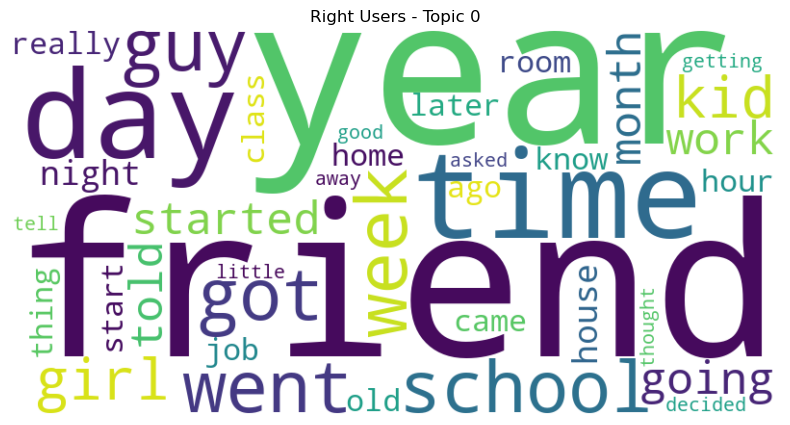

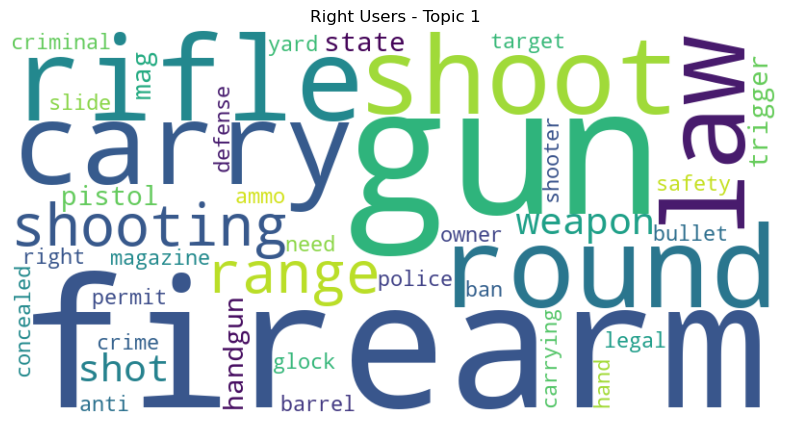

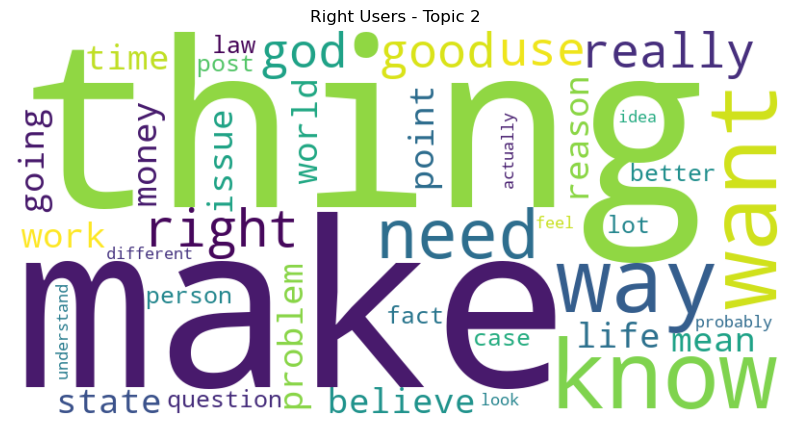

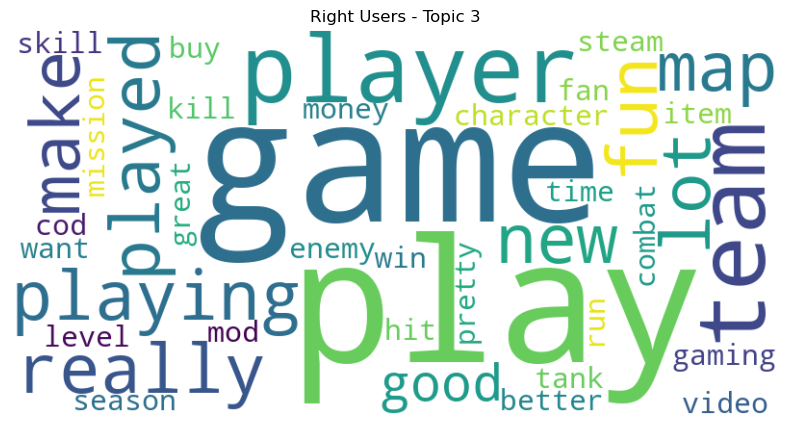

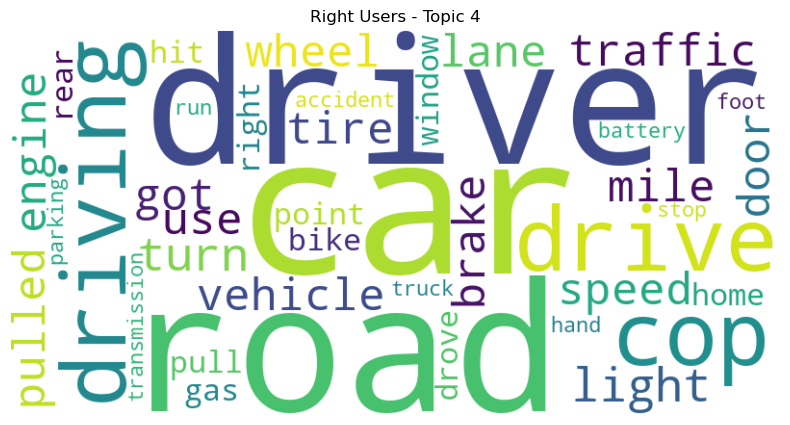

In [46]:
def show_wordcloud(words, title="Word Cloud"):
    wc = WordCloud(width=800, height=400, background_color='white')
    wc.generate(" ".join(words))
    plt.figure(figsize=(10,5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

for i in range(len(topics_right)):
    show_wordcloud(topics_right[i], title=f"Right Users - Topic {i}")

Topics for left oriented

In [47]:
left_posts = df[df['author orientation'] == 'left']['clean_content'].dropna()
# Left users only
lda_left, vect_left, topics_left = extract_topics(left_posts)
df_left_topics = topics_to_df(topics_left)
df_left_topics.to_csv("left_topics.csv")

topic_words_dict_left = {col: df_left_topics[col].dropna().tolist() for col in df_left_topics.columns}

# top 20 words in each category
print(topic_words_dict_left['Topic 0'][:n_words])  # Personal life, everyday events
print(topic_words_dict_left['Topic 1'][:n_words])  # Gender-based rights, Sexuality
print(topic_words_dict_left['Topic 2'][:n_words])  # Rights and Beliefs, religion
print(topic_words_dict_left['Topic 3'][:n_words])  # Video games, gaming, entertainment
print(topic_words_dict_left['Topic 4'][:n_words])  # School/work, Economy

['friend', 'like', 'time', 'day', 'got', 'guy', 'year', 'really', 'know', 'girl', 'feel', 'kid', 'went', 'going', 'thing', 'want', 'shit', 'told', 'started', 'car']
['woman', 'men', 'male', 'sex', 'gender', 'rape', 'man', 'feminist', 'female', 'feminism', 'sexual', 'child', 'guy', 'want', 'girl', 'relationship', 'gay', 'issue', 'victim', 'partner']
['thing', 'like', 'make', 'way', 'world', 'god', 'life', 'know', 'right', 'human', 'mean', 'question', 'believe', 'person', 'point', 'good', 'problem', 'really', 'religion', 'want']
['game', 'player', 'play', 'team', 'character', 'playing', 'like', 'played', 'video', 'gaming', 'new', 'make', 'level', 'season', 'fun', 'good', 'win', 'gameplay', 'really', 'point']
['job', 'money', 'school', 'work', 'year', 'pay', 'company', 'college', 'student', 'need', 'time', 'loan', 'cost', 'business', 'class', 'working', 'month', 'tax', 'market', 'program']


Wordclouds for left oriented

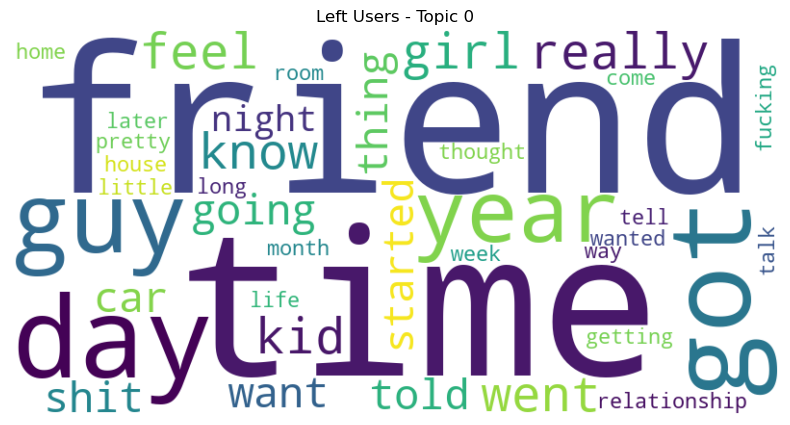

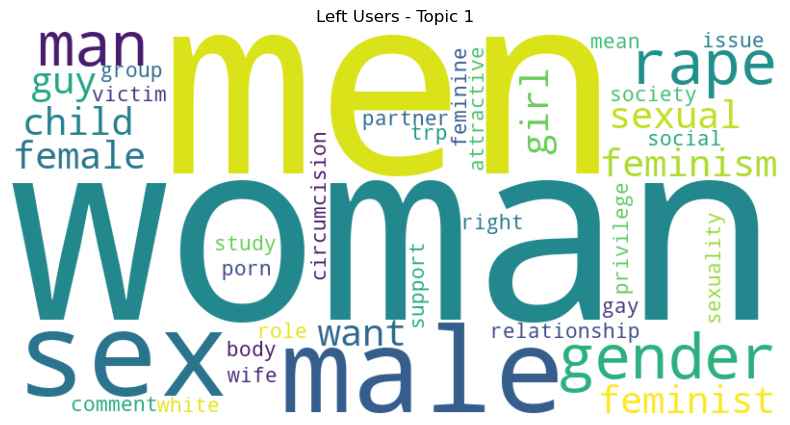

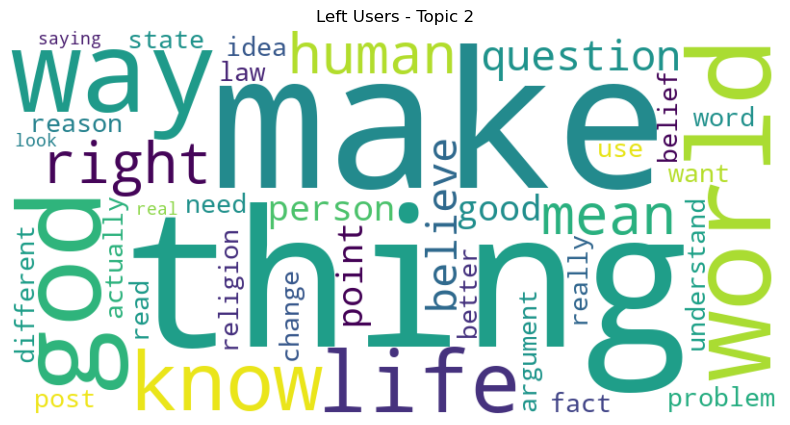

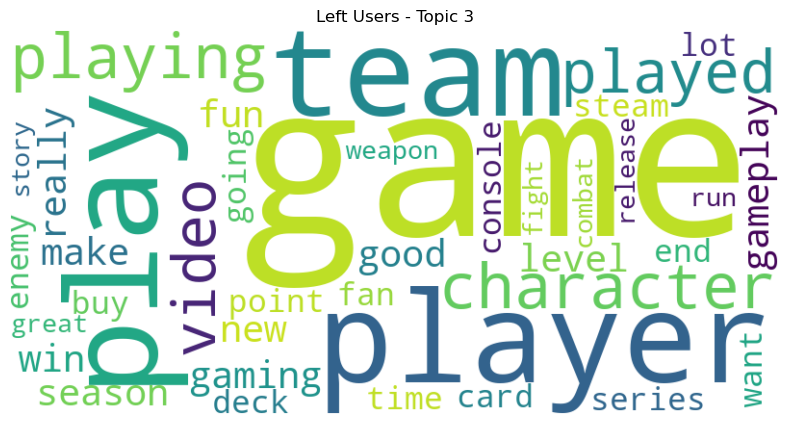

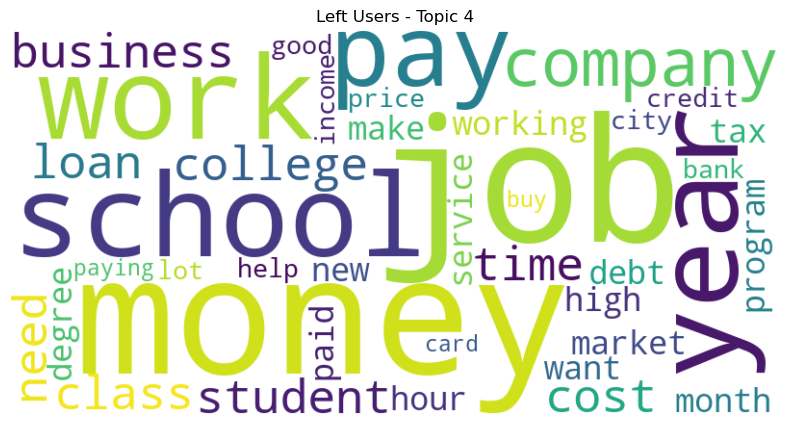

In [48]:
for i in range(len(topics_left)):
    show_wordcloud(topics_left[i], title=f"Left Users - Topic {i}")

### Extra: Data for centrist users and other considerations 

In [49]:
def show_wordcloud(text, title):
    wc = WordCloud(
        width=1000, height=600,
        stopwords=stop_words,
        background_color="white",
        max_words=200,
        collocations=True
    ).generate(text)

    plt.figure(figsize=(12, 7))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title(title, fontsize=18)
    plt.show()

Political vs. non-political word clouds

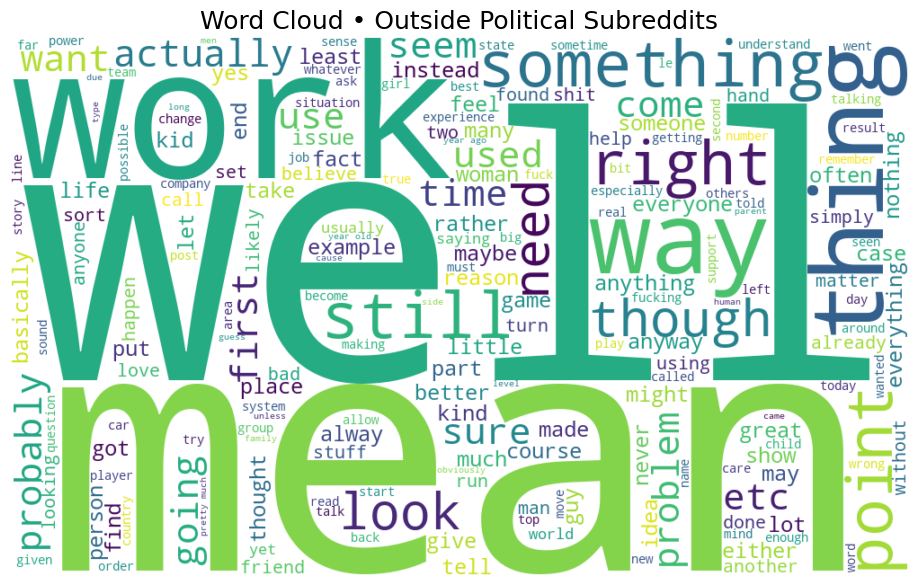

In [50]:
nonpolitical_text = " ".join(df_wc[~df_wc['in_political_sub']]['clean_content'])

# show_wordcloud(political_text, "Word Cloud • In Political Subreddits")
show_wordcloud(nonpolitical_text, "Word Cloud • Outside Political Subreddits")

Word clouds based on user political orientation

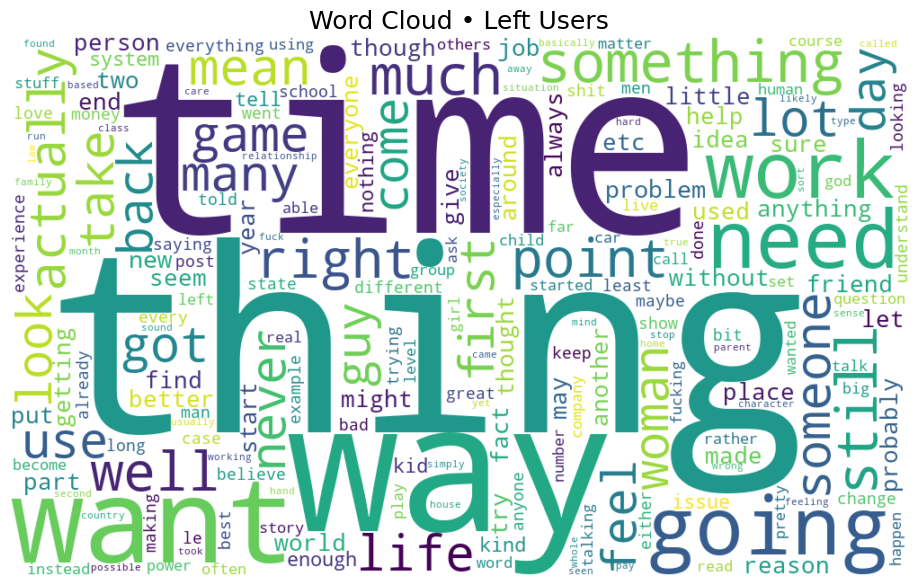

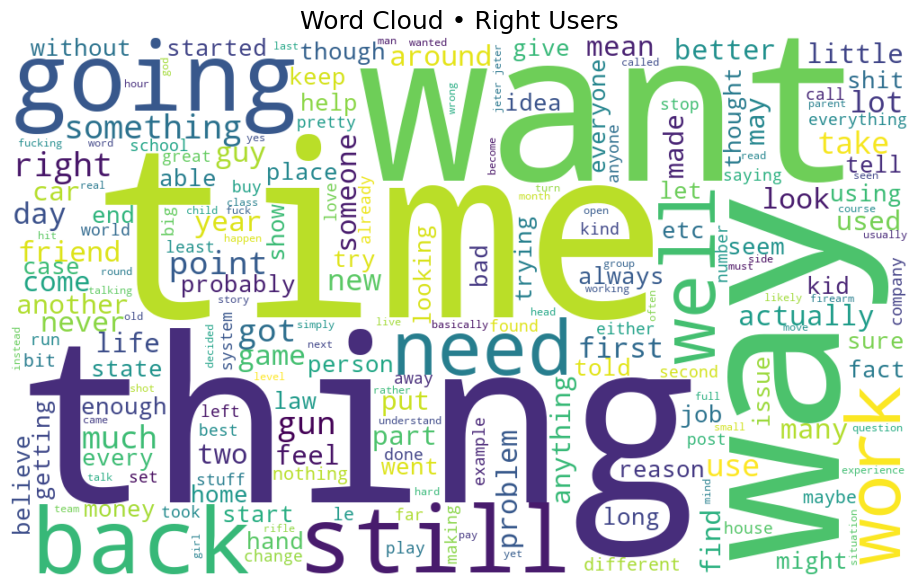

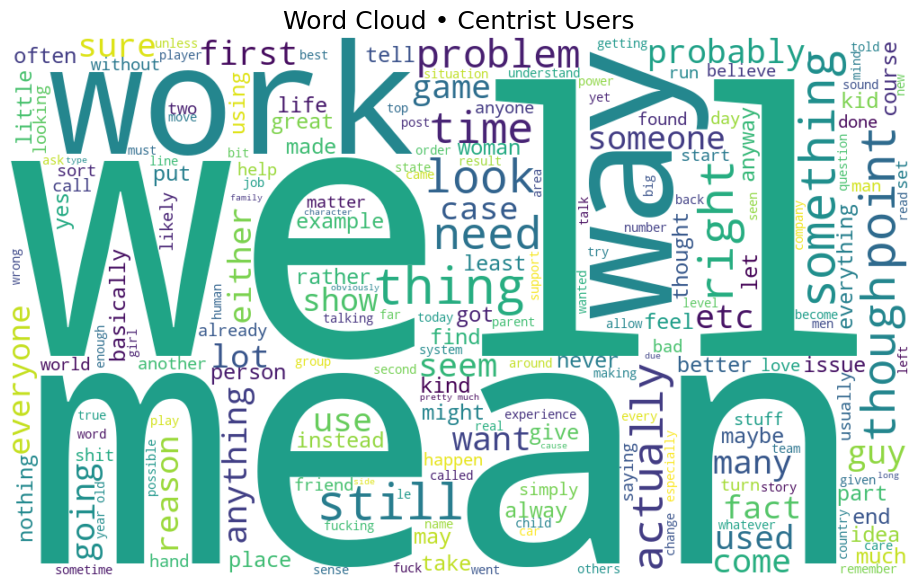

In [51]:
orient_groups = ["left", "right", "centrist"]

for orientation in orient_groups:
    subset = df_wc[df_wc['author orientation'] == orientation]
    if len(subset) > 0:
        text = " ".join(subset['clean_content'])
        show_wordcloud(text, f"Word Cloud • {orientation.capitalize()} Users")

Word clouds by orientation insde vs. outside political subreddits

Processing: left


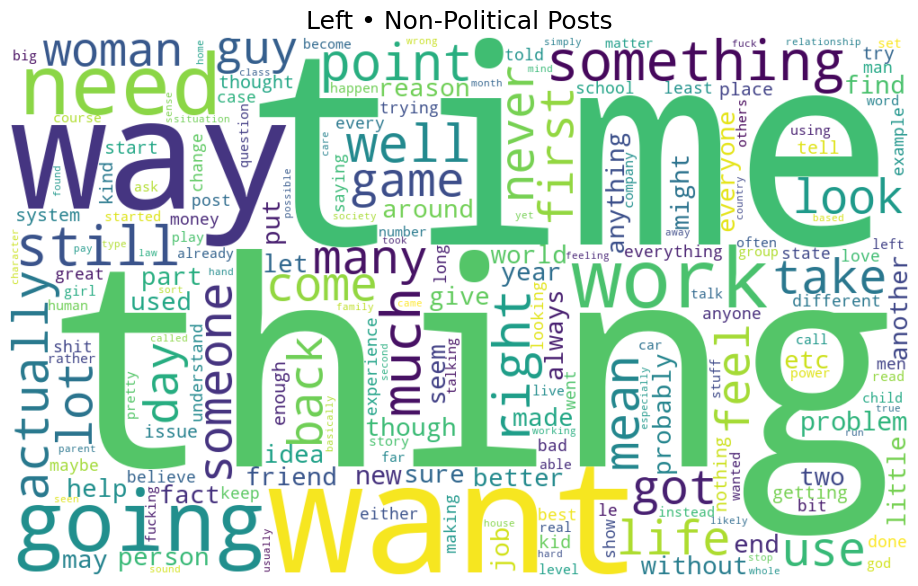

Processing: right


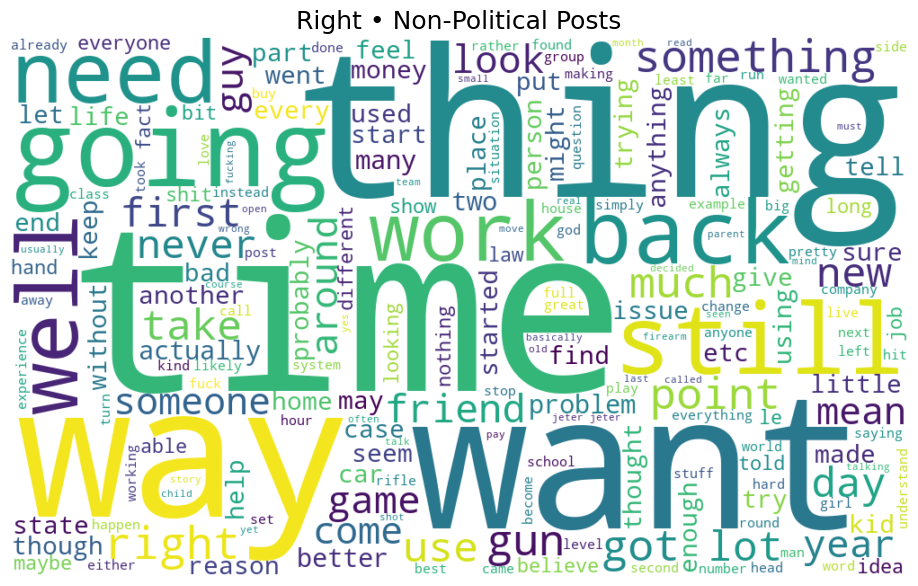

Processing: centrist


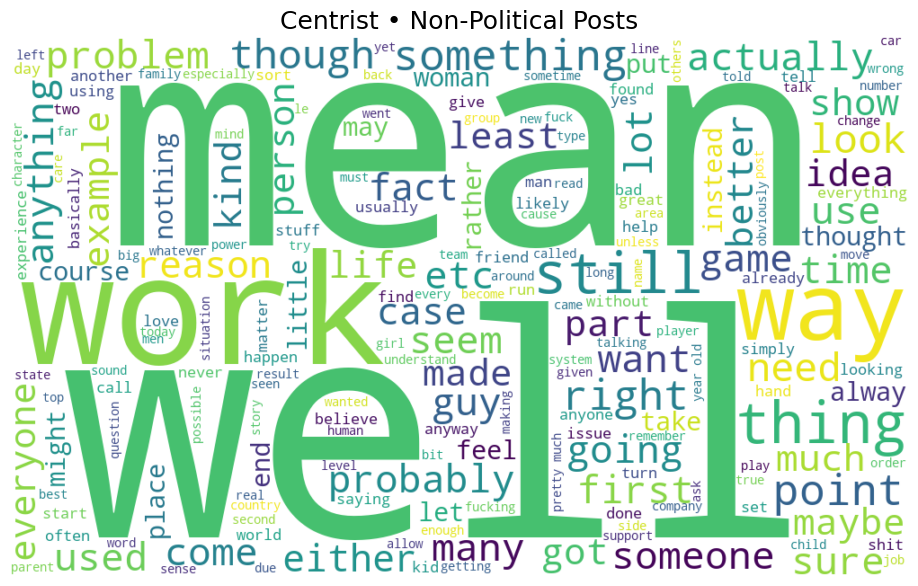

In [52]:
for orientation in orient_groups:
    print(f"Processing: {orientation}")

    # inside political
    inside = df_wc[(df_wc['author orientation'] == orientation) & 
                   (df_wc['in_political_sub'])]
    if len(inside) > 0:
        show_wordcloud(
            " ".join(inside['clean_content']),
            f"{orientation.capitalize()} • Political Posts"
        )

    # outside political
    outside = df_wc[(df_wc['author orientation'] == orientation) & 
                    (~df_wc['in_political_sub'])]
    if len(outside) > 0:
        show_wordcloud(
            " ".join(outside['clean_content']),
            f"{orientation.capitalize()} • Non-Political Posts"
        )


Centrist topics

In [53]:
centrist_posts = df[df['author orientation'] == 'centrist']['clean_content']

# All political users combined
lda_centrist, vect_centrist, topics_centrist = extract_topics(centrist_posts)


df_centrist_topics = topics_to_df(topics_centrist)

df_centrist_topics.to_csv("topics_centrist.csv")


topic_words_dict_centrist = {col: df_centrist_topics[col].dropna().tolist() for col in df_centrist_topics.columns}

# Top 20 categories
print(topic_words_dict_centrist['Topic 0'][:n_words])  # Beliefs, society
print(topic_words_dict_centrist['Topic 1'][:n_words])  # Gaming
print(topic_words_dict_centrist['Topic 2'][:n_words])  # Relationships, social, personal life
print(topic_words_dict_centrist['Topic 3'][:n_words])  # gender, gender rights, sexuality 
print(topic_words_dict_centrist['Topic 4'][:n_words])  # economy

['like', 'thing', 'know', 'make', 'way', 'want', 'really', 'god', 'point', 'right', 'life', 'need', 'good', 'person', 'mean', 'feel', 'world', 'post', 'time', 'believe']
['game', 'play', 'player', 'team', 'playing', 'played', 'like', 'time', 'fun', 'win', 'character', 'video', 'level', 'new', 'gaming', 'console', 'good', 'really', 'make', 'better']
['friend', 'time', 'got', 'day', 'year', 'guy', 'school', 'kid', 'girl', 'went', 'like', 'told', 'night', 'car', 'going', 'really', 'started', 'week', 'know', 'home']
['woman', 'men', 'sex', 'girl', 'male', 'man', 'guy', 'female', 'relationship', 'gender', 'rape', 'sexual', 'feminist', 'child', 'want', 'gay', 'feminism', 'attractive', 'society', 'like']
['money', 'job', 'pay', 'company', 'work', 'year', 'cost', 'tax', 'price', 'business', 'buy', 'market', 'need', 'service', 'make', 'new', 'month', 'paid', 'use', 'rate']


Centrist wordclouds

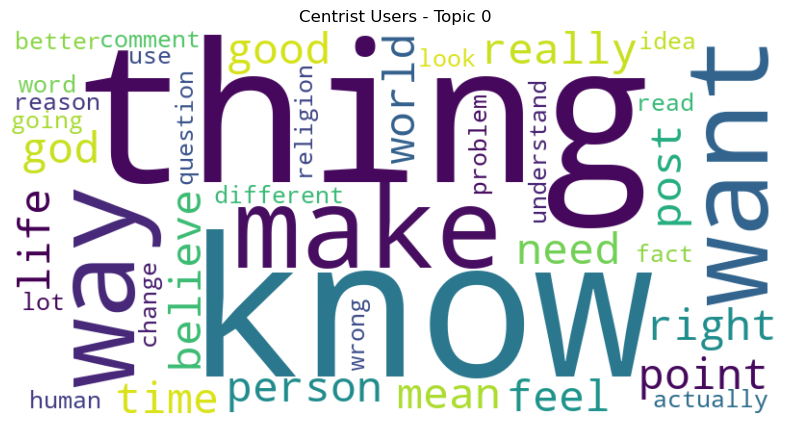

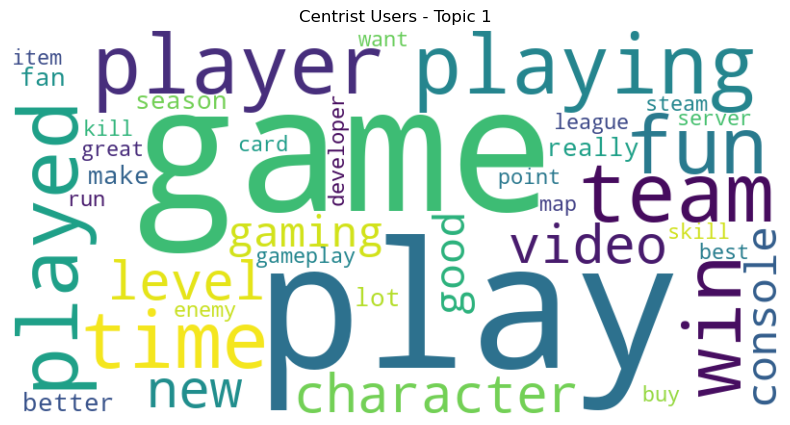

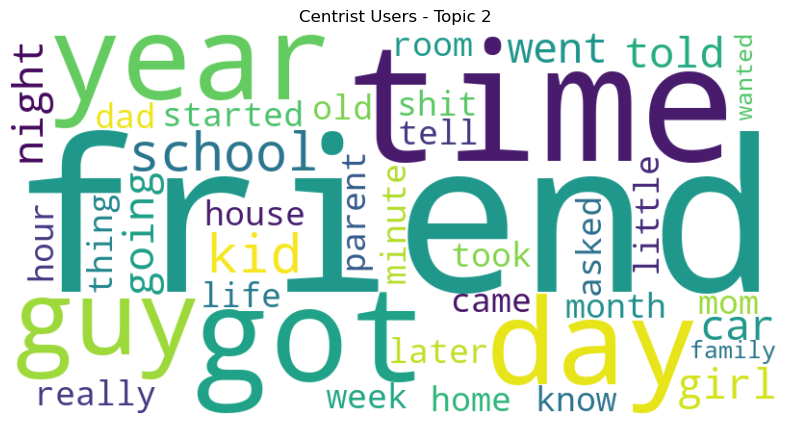

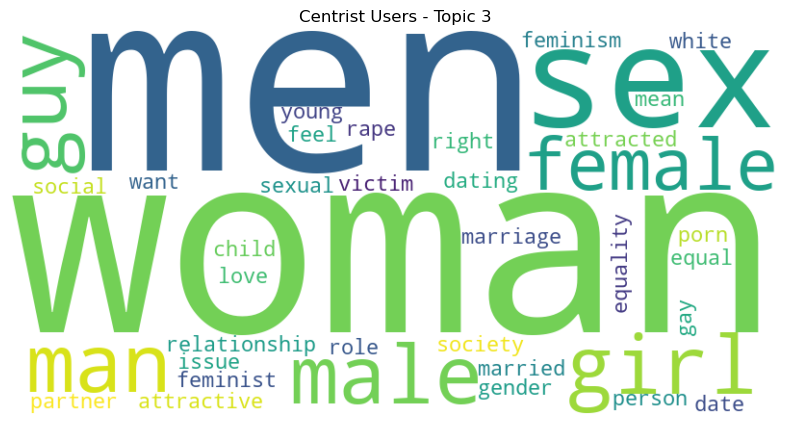

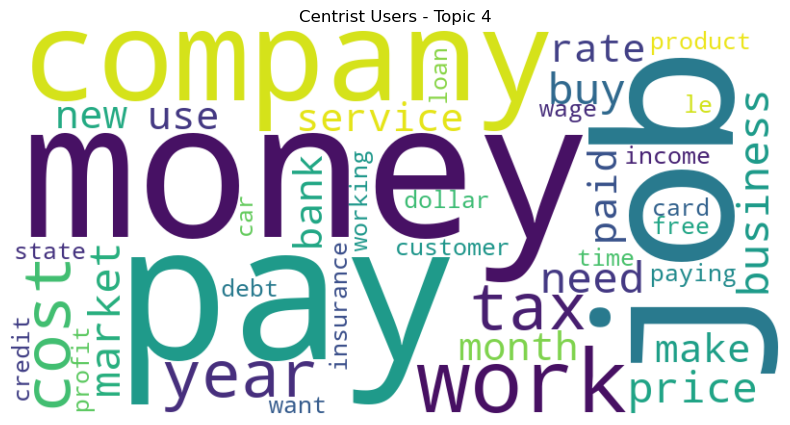

In [54]:
def show_wordcloud(words, title="Word Cloud"):
    wc = WordCloud(width=800, height=400, background_color='white')
    wc.generate(" ".join(words))
    plt.figure(figsize=(10,5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

# Top topics among all users
for i in range(len(topics_centrist)):
    show_wordcloud(topics_centrist[i], title=f"Centrist Users - Topic {i}")